# **Libraries**

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.cm as cm
import matplotlib.colors as mcolors

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
!ls drive/MyDrive/Oslo/data/ireceptor/output/esm2

H_CDR3.pt  old	TSNE_H_CDR3.pkl  UMAP_H_CDR3.pkl


# **Plots**

In [ ]:
!rm *

rm: cannot remove 'drive': Is a directory
rm: cannot remove 'sample_data': Is a directory


In [ ]:
chain = 'H'
segment = 'CDR3'
model_name = 'esm2'
red = 'TSNE'

dataset_name = f'{chain}_{segment}'

In [ ]:
# Load UMAP df
umap_df = pd.DataFrame(pd.read_pickle(f'drive/MyDrive/Oslo/data/ireceptor/output/{model_name}/{red}_{dataset_name}.pkl').values)
umap_df.columns = ['x', 'y']
umap_df['id'] = range(1, len(umap_df) + 1)

# Load OLGA's output
with open(f'drive/MyDrive/Oslo/data/ireceptor/output/olga/pgen_{dataset_name}.fa', 'r') as file:
    lines = file.readlines()
data = [line.strip().split('\t') for line in lines]
pgen_df = pd.DataFrame(data, columns=['junction_aa', 'pgen'])
#pgen_df['id'] = range(1, len(pgen_df) + 1)
pgen_df['pgen'] = pgen_df['pgen'].astype(float)
pgen_df['log_pgen'] = pgen_df['pgen'].apply(lambda x: np.log(x))
pgen_df['log_pgen'].replace(-np.inf, np.nan, inplace=True)

# Load metadata df
metadata_df = pd.read_csv(f'drive/MyDrive/Oslo/data/ireceptor/{dataset_name}.csv', sep=';')

# Merge datasets
merged_df = pd.merge(metadata_df, umap_df, on='id')
merged_df = pd.merge(merged_df, pgen_df, on='junction_aa')

# Add new columns
merged_df['junction_length'] = metadata_df['junction_aa'].apply(len)

merged_df['v_family'] = metadata_df['v_call'].str.split(r'[-/]').str[0]
merged_df['d_family'] = metadata_df['d_call'].str.split(r'[-/]').str[0]
merged_df['j_family'] = metadata_df['j_call'].str.split(r'[*/]').str[0]

merged_df

,sequence_id,sequence_aa,productive,locus,v_call,d_call,j_call,c_call,junction_aa,duplicate_count,...,cdr3_aa,id,x,y,pgen,log_pgen,junction_length,v_family,d_family,j_family
0,5f39ba19616aa7007f0781cb,NaN,True,IGH,IGHV3-23*01,IGHD3-16*01,IGHJ4*02,IgM,CAKCGDGIYADYYFDYW,NaN,...,AKCGDGIYADYYFDY,1,59.637272,21.202370,2.134764e-17,-38.385590,17,IGHV3,IGHD3,IGHJ4
1,5f39dbfa616aa7007f274a4b,NaN,True,IGH,IGHV3-30*18,IGHD4-17*01,IGHJ4*02,IgM,CAKGGGTVTTGGFDYW,NaN,...,AKGGGTVTTGGFDY,2,-71.672096,-5.943208,1.655611e-11,-24.824266,16,IGHV3,IGHD4,IGHJ4
2,5f3b63aa616aa7007f97e5a3,NaN,True,IGH,IGHV3-23*01,IGHD3-22*01,IGHJ5*02,IgM,CAKDSSAWSKDSW,NaN,...,AKDSSAWSKDS,3,-21.525492,49.215725,1.227753e-16,-36.636176,13,IGHV3,IGHD3,IGHJ5
3,5f3bf67b616aa7007f99fe44,NaN,True,IGH,IGHV4-59*10,IGHD3-22*01,IGHJ4*02,IgM,CARETYYYDSSGYYINYFDYW,NaN,...,ARETYYYDSSGYYINYFDY,4,77.168419,4.993960,1.994116e-11,-24.638235,21,IGHV4,IGHD3,IGHJ4
4,5f3ab978616aa7007fbccf00,NaN,True,IGH,IGHV4-31*03,IGHD3-10*01,IGHJ4*02,IgM,CAREGVNRTWFGELSPPYFDYW,NaN,...,AREGVNRTWFGELSPPYFDY,5,9.971977,-35.928921,4.915033e-18,-39.854233,22,IGHV4,IGHD3,IGHJ4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
799995,5f3c3df3616aa7007f1b2e71,NaN,True,IGH,IGHV1-8*02,IGHD3-22*01,IGHJ4*02,IgM,CARGTIAVANDYW,NaN,...,ARGTIAVANDY,799996,-72.818962,-45.824848,2.302881e-10,-22.191690,13,IGHV1,IGHD3,IGHJ4
799996,5f3b4eda616aa7007fd050ab,NaN,True,IGH,IGHV3-30*04,IGHD3-16*01,IGHJ3*02,IgG1,CARVPDFGELQLFAYDIW,NaN,...,ARVPDFGELQLFAYDI,799997,-16.902672,-17.549288,1.481166e-21,-47.961457,18,IGHV3,IGHD3,IGHJ3
799997,5f3c116d616aa7007f9098f9,NaN,True,IGH,IGHV4-59*01,IGHD3-10*02,IGHJ4*02,IgM,CARASVLLSADFW,NaN,...,ARASVLLSADF,799998,-26.898037,-49.070526,1.766685e-15,-33.969671,13,IGHV4,IGHD3,IGHJ4
799998,5f3bca2d616aa7007f1b738f,NaN,True,IGH,IGHV1-2*03,IGHD2-8*02,IGHJ4*02,IgM,CARVRVVNSKAFDYW,NaN,...,ARVRVVNSKAFDY,799999,-45.779415,-22.685198,4.221661e-14,-30.795963,15,IGHV1,IGHD2,IGHJ4


## **Feature distributions**

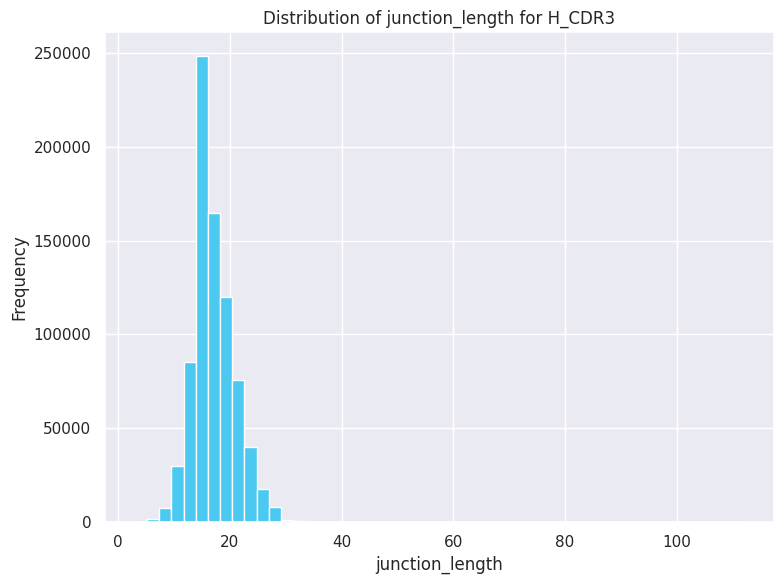

Max:  112
Min:  3


In [ ]:
label = 'junction_length'

data = merged_df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', merged_df[label].max())
print('Min: ', merged_df[label].min())

In [ ]:
filtered_df = merged_df[(merged_df['junction_length'] <= 40) & (merged_df['log_pgen'] >= -90)]

# Remove duplicates based on the 'junction_aa' column
filtered_df = filtered_df.drop_duplicates(subset='junction_aa', keep='first')

filtered_df

,sequence_id,sequence_aa,productive,locus,v_call,d_call,j_call,c_call,junction_aa,duplicate_count,...,cdr3_aa,id,x,y,pgen,log_pgen,junction_length,v_family,d_family,j_family
0,5f39ba19616aa7007f0781cb,NaN,True,IGH,IGHV3-23*01,IGHD3-16*01,IGHJ4*02,IgM,CAKCGDGIYADYYFDYW,NaN,...,AKCGDGIYADYYFDY,1,59.637272,21.202370,2.134764e-17,-38.385590,17,IGHV3,IGHD3,IGHJ4
1,5f39dbfa616aa7007f274a4b,NaN,True,IGH,IGHV3-30*18,IGHD4-17*01,IGHJ4*02,IgM,CAKGGGTVTTGGFDYW,NaN,...,AKGGGTVTTGGFDY,2,-71.672096,-5.943208,1.655611e-11,-24.824266,16,IGHV3,IGHD4,IGHJ4
2,5f3b63aa616aa7007f97e5a3,NaN,True,IGH,IGHV3-23*01,IGHD3-22*01,IGHJ5*02,IgM,CAKDSSAWSKDSW,NaN,...,AKDSSAWSKDS,3,-21.525492,49.215725,1.227753e-16,-36.636176,13,IGHV3,IGHD3,IGHJ5
3,5f3bf67b616aa7007f99fe44,NaN,True,IGH,IGHV4-59*10,IGHD3-22*01,IGHJ4*02,IgM,CARETYYYDSSGYYINYFDYW,NaN,...,ARETYYYDSSGYYINYFDY,4,77.168419,4.993960,1.994116e-11,-24.638235,21,IGHV4,IGHD3,IGHJ4
4,5f3ab978616aa7007fbccf00,NaN,True,IGH,IGHV4-31*03,IGHD3-10*01,IGHJ4*02,IgM,CAREGVNRTWFGELSPPYFDYW,NaN,...,AREGVNRTWFGELSPPYFDY,5,9.971977,-35.928921,4.915033e-18,-39.854233,22,IGHV4,IGHD3,IGHJ4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
799995,5f3c3df3616aa7007f1b2e71,NaN,True,IGH,IGHV1-8*02,IGHD3-22*01,IGHJ4*02,IgM,CARGTIAVANDYW,NaN,...,ARGTIAVANDY,799996,-72.818962,-45.824848,2.302881e-10,-22.191690,13,IGHV1,IGHD3,IGHJ4
799996,5f3b4eda616aa7007fd050ab,NaN,True,IGH,IGHV3-30*04,IGHD3-16*01,IGHJ3*02,IgG1,CARVPDFGELQLFAYDIW,NaN,...,ARVPDFGELQLFAYDI,799997,-16.902672,-17.549288,1.481166e-21,-47.961457,18,IGHV3,IGHD3,IGHJ3
799997,5f3c116d616aa7007f9098f9,NaN,True,IGH,IGHV4-59*01,IGHD3-10*02,IGHJ4*02,IgM,CARASVLLSADFW,NaN,...,ARASVLLSADF,799998,-26.898037,-49.070526,1.766685e-15,-33.969671,13,IGHV4,IGHD3,IGHJ4
799998,5f3bca2d616aa7007f1b738f,NaN,True,IGH,IGHV1-2*03,IGHD2-8*02,IGHJ4*02,IgM,CARVRVVNSKAFDYW,NaN,...,ARVRVVNSKAFDY,799999,-45.779415,-22.685198,4.221661e-14,-30.795963,15,IGHV1,IGHD2,IGHJ4


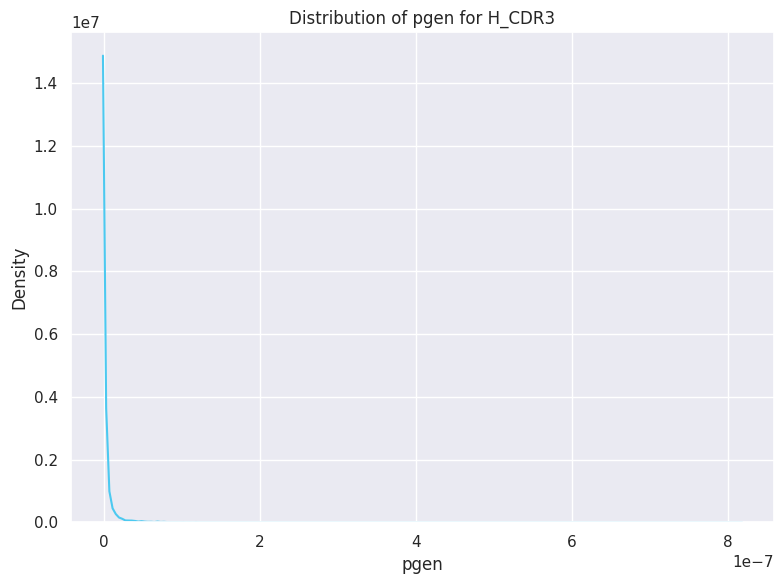

Max:  8.174332091497471e-07
Min:  8.756742961896837e-27


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

label = 'pgen'
data = filtered_df[label]

# Create a separate figure for the plot
fig, ax = plt.subplots(figsize=(8, 6))

# Create a KDE plot (smooth line plot)
sns.kdeplot(data, ax=ax, color='#4CC9F0')

ax.set_title(f'Distribution of {label} for {dataset_name}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Density')  # Y-axis label is "Density" for a smooth line plot

# Set the x-axis limits from 1e-40 to the maximum value in the data
max_value = filtered_df[label].max()
#ax.set_xscale('log')
#ax.set_xlim(1e-40, max_value)

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plot
plt.show()

print('Max: ', max_value)
print('Min: ', filtered_df[label].min())


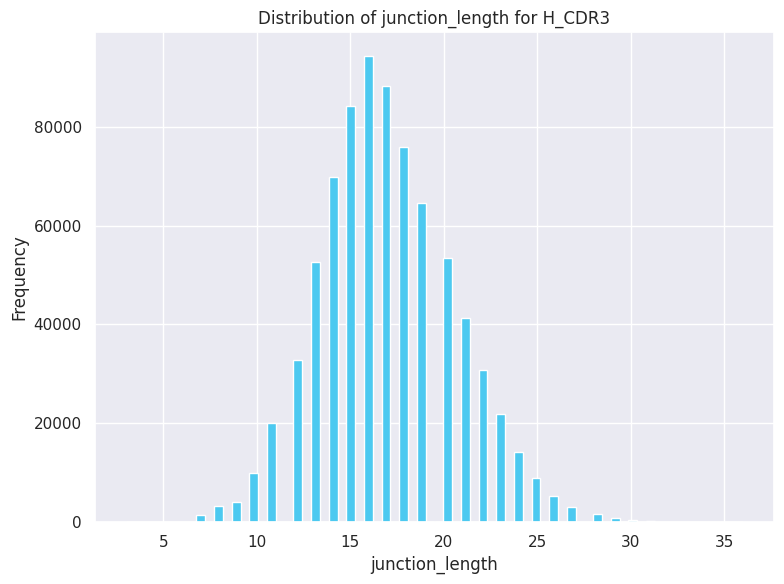

Max:  112
Min:  3


In [ ]:
label = 'junction_length'
data = filtered_df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=70, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', merged_df[label].max())
print('Min: ', merged_df[label].min())

In [ ]:
filtered_df.columns

Index(['sequence_id', 'sequence_aa', 'productive', 'locus', 'v_call', 'd_call',
       'j_call', 'c_call', 'junction_aa', 'duplicate_count', 'repertoire_id',
       'cdr1_aa', 'cdr2_aa', 'cdr3_aa', 'id', 'x', 'y', 'pgen', 'log_pgen',
       'junction_length', 'v_family', 'd_family', 'j_family'],
      dtype='object')

## **Continuous variables**

<ipython-input-132-48d86df4c95f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  original_cmap = cm.get_cmap(cmap_name)
<ipython-input-132-48d86df4c95f>:18: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, label=hue_name)


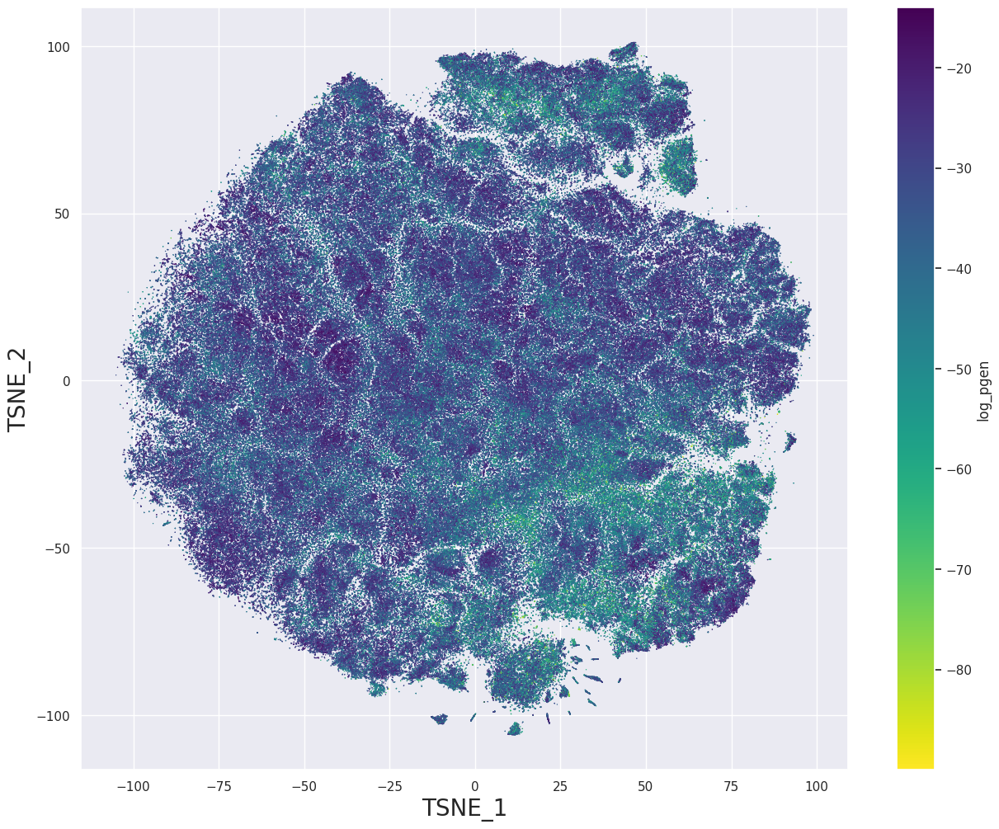

In [ ]:
hue_name = 'log_pgen'
cmap_name = 'viridis'

original_cmap = cm.get_cmap(cmap_name)

# Reverse the colormap
reversed_cmap = mcolors.ListedColormap(original_cmap.colors[::-1])

# Create the scatterplot
plt.figure(figsize=(15, 12))
scatter = sns.scatterplot(data=filtered_df, x='x', y='y', s=1, linewidth=0, c=filtered_df[hue_name], cmap=reversed_cmap)

# Create a ScalarMappable for the colorbar
sm = cm.ScalarMappable(cmap=reversed_cmap, norm=plt.Normalize(vmin=filtered_df[hue_name].min(), vmax=filtered_df[hue_name].max()))
sm.set_array([])  # You need to set an empty array for it to work

# Add a colorbar for 'mu_freq_heavy'
cbar = plt.colorbar(sm, label=hue_name)

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

<ipython-input-143-c84c18d544b0>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  original_cmap = cm.get_cmap(cmap_name)
<ipython-input-143-c84c18d544b0>:18: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, label=hue_name)


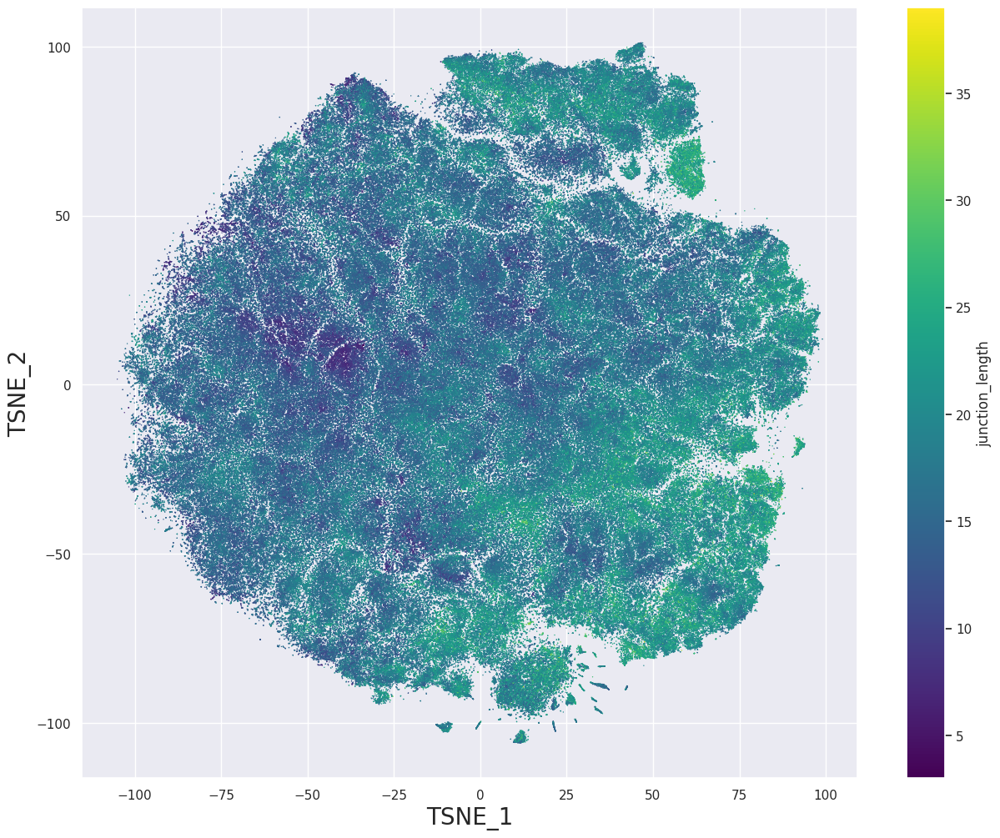

In [ ]:
hue_name = 'junction_length'
cmap_name = 'viridis'

original_cmap = cm.get_cmap(cmap_name)

# Reverse the colormap
reversed_cmap = mcolors.ListedColormap(original_cmap.colors[::-1])

# Create the scatterplot
plt.figure(figsize=(15, 12))
scatter = sns.scatterplot(data=filtered_df, x='x', y='y', s=1, linewidth=0, c=filtered_df[hue_name], cmap=cmap_name)

# Create a ScalarMappable for the colorbar
sm = cm.ScalarMappable(cmap=cmap_name, norm=plt.Normalize(vmin=filtered_df[hue_name].min(), vmax=filtered_df[hue_name].max()))
sm.set_array([])  # You need to set an empty array for it to work

# Add a colorbar for 'mu_freq_heavy'
cbar = plt.colorbar(sm, label=hue_name)

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

<Figure size 1200x1200 with 0 Axes>

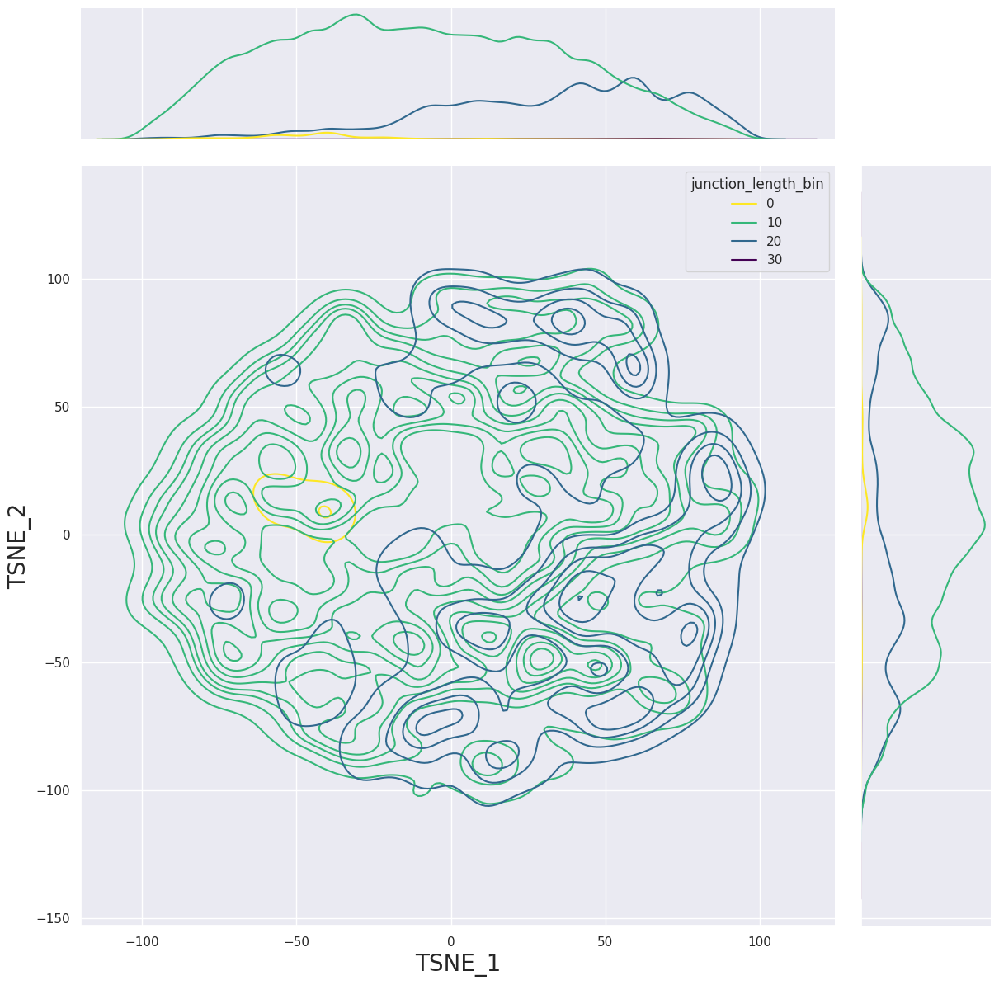

In [ ]:
hue_name = 'log_pgen'

# Calculate the bins for junction lengths with a bin width of 4
bin_width = 10
filtered_df[f'{hue_name}_bin'] = (filtered_df[hue_name] // bin_width) * bin_width

plt.figure(figsize=(12, 12))
#sns.kdeplot(data=umap_df, x='x', y='y', fill=True)
sns.jointplot(data=filtered_df, x='x', y='y', kind='kde', hue=f'{hue_name}_bin', fill=False, height=12, palette=reversed_cmap)
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)
plt.savefig(f'{model_name}_{red}_KDE_{dataset_name}_{hue_name}.png')
plt.show()

## **Class features**

In [ ]:
filtered_df.columns

Index(['sequence_id', 'sequence_aa', 'productive', 'locus', 'v_call', 'd_call',
       'j_call', 'c_call', 'junction_aa', 'duplicate_count', 'repertoire_id',
       'cdr1_aa', 'cdr2_aa', 'cdr3_aa', 'id', 'x', 'y', 'pgen', 'log_pgen',
       'junction_length', 'v_family', 'd_family', 'j_family'],
      dtype='object')

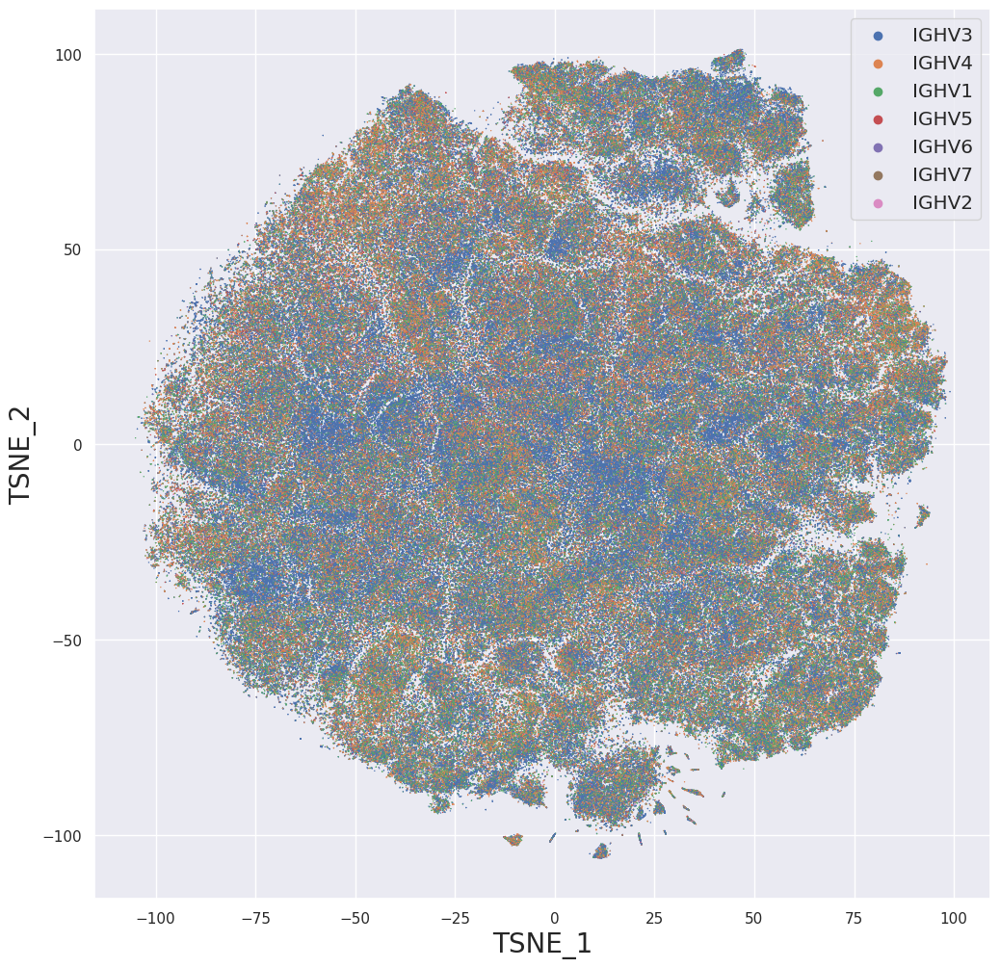

In [ ]:
# Define hue_name
hue_name = 'v_family'

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df, x='x', y='y', s=1, linewidth=0, hue=hue_name)

# Set the legend
plt.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize='large')

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

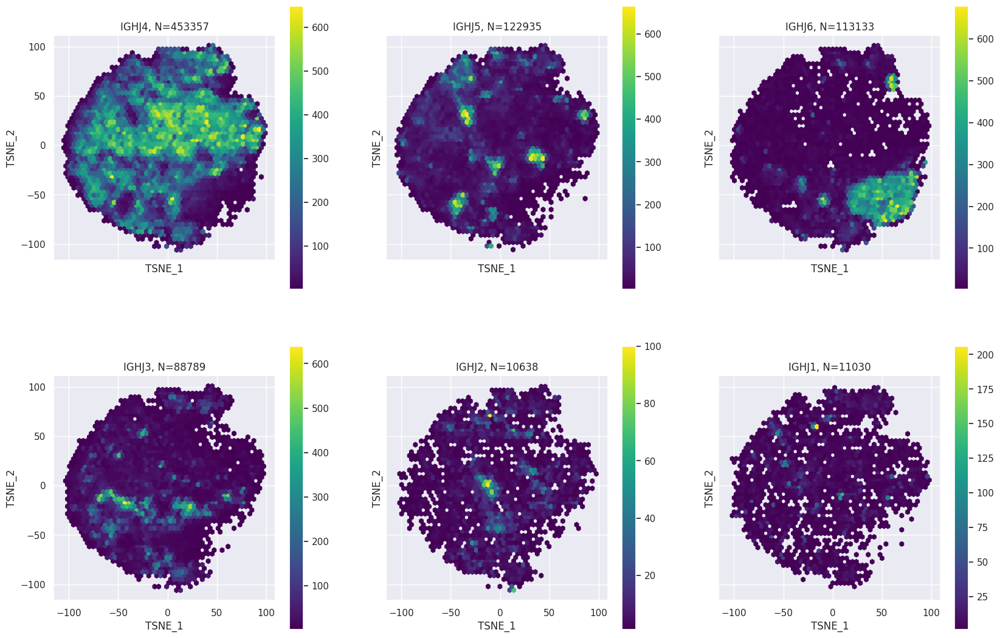

In [ ]:
gridsize = 50

# Get the unique classes
unique_classes = filtered_df[hue_name].unique()

# Calculate the number of rows and columns based on the number of unique classes
num_classes = len(unique_classes)
num_rows = int(num_classes**0.5)
num_cols = (num_classes + num_rows - 1) // num_rows

# Calculate the figure size to fit the square subplots and maintain the overall aspect ratio
fig_width = 20
fig_height = 20 * (num_rows / num_cols)

# Create a grid of subplots with equal aspect ratio
fig, axes = plt.subplots(num_rows, num_cols, figsize=(fig_width, fig_height), sharex=True, sharey=True)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through the unique classes and create hexbin plots with titles
for i, el in enumerate(unique_classes):
    ax = axes[i]
    x_data = filtered_df[filtered_df[hue_name] == el]['x']
    y_data = filtered_df[filtered_df[hue_name] == el]['y']

    # Set the aspect ratio to be equal (square)
    ax.set_aspect('equal')

    num_data_points = len(x_data)

    # Create a hexbin plot
    hb = ax.hexbin(x_data, y_data, gridsize=gridsize, mincnt=1, cmap='viridis')

    ax.set_title(f'{el}, N={num_data_points}')
    ax.set_xlabel(f'{red}_1', fontsize=12)
    ax.set_ylabel(f'{red}_2', fontsize=12)

    plt.colorbar(hb, ax=ax)  # Add colorbar

# Remove any empty subplots if the number of plots doesn't fill the grid
for i in range(num_classes, num_rows * num_cols):
    fig.delaxes(axes[i])

# Adjust layout to remove the gap between rows and columns
#plt.subplots_adjust(hspace=0, wspace=0)

# Display the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_hexbin_sep_by_{hue_name}.png')
plt.show()

In [ ]:
!zip -r /content/prott5.zip /content/prott5*

  adding: content/prott5_UMAP_H_CDR3_d_family.png (deflated 2%)
  adding: content/prott5_UMAP_H_CDR3_j_family.png (deflated 2%)
  adding: content/prott5_UMAP_H_CDR3_junction_length.png (deflated 2%)
  adding: content/prott5_UMAP_H_CDR3_log_pgen.png (deflated 1%)
  adding: content/prott5_UMAP_H_CDR3_v_family.png (deflated 2%)


## **Correlations**

In [ ]:
correlation = filtered_df['junction_length'].corr(filtered_df['log_pgen'], method='spearman')
print(f"Spearman's correlation coefficient: {correlation}")

Spearman's correlation coefficient: -0.5562168472570038


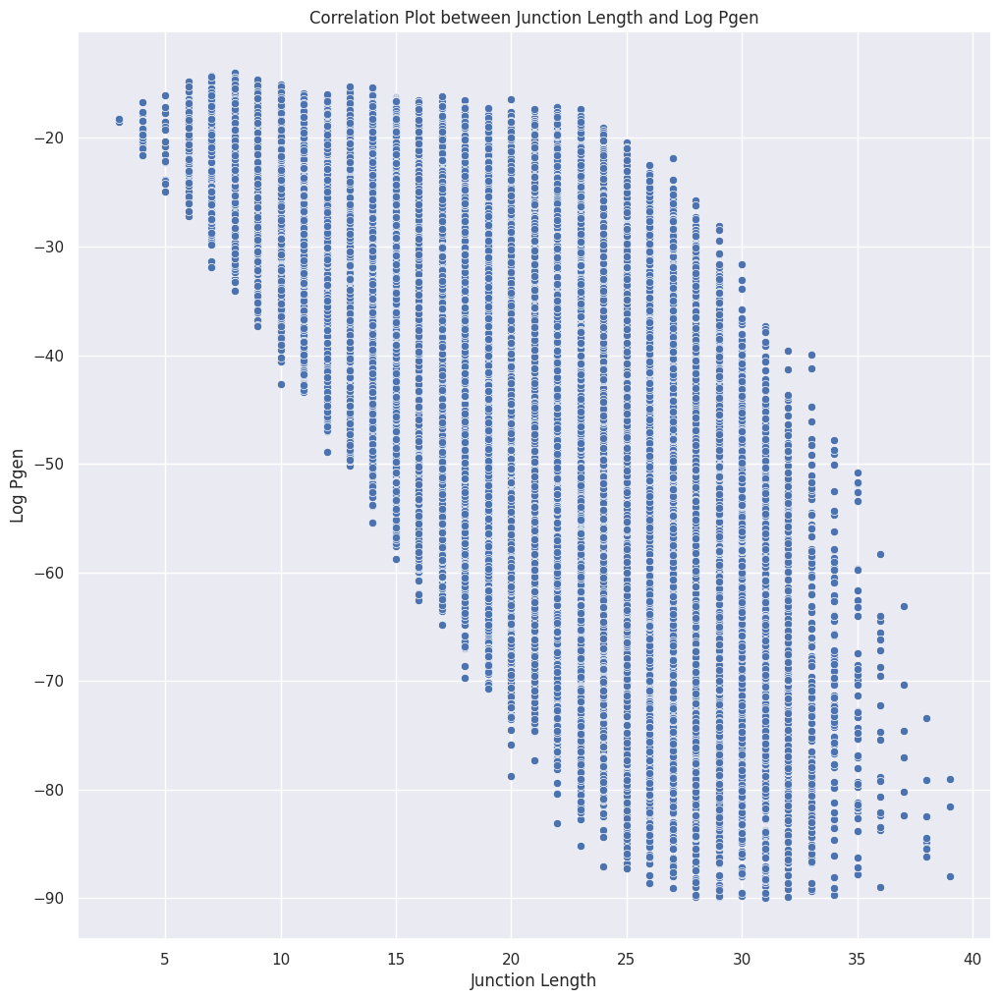

In [ ]:
#sns.set(style="whitegrid")
plt.figure(figsize=(12, 12))
sns.scatterplot(x='junction_length', y='log_pgen', data=filtered_df)
plt.title('Correlation Plot between Junction Length and Log Pgen')
plt.xlabel('Junction Length')
plt.ylabel('Log Pgen')
plt.show()

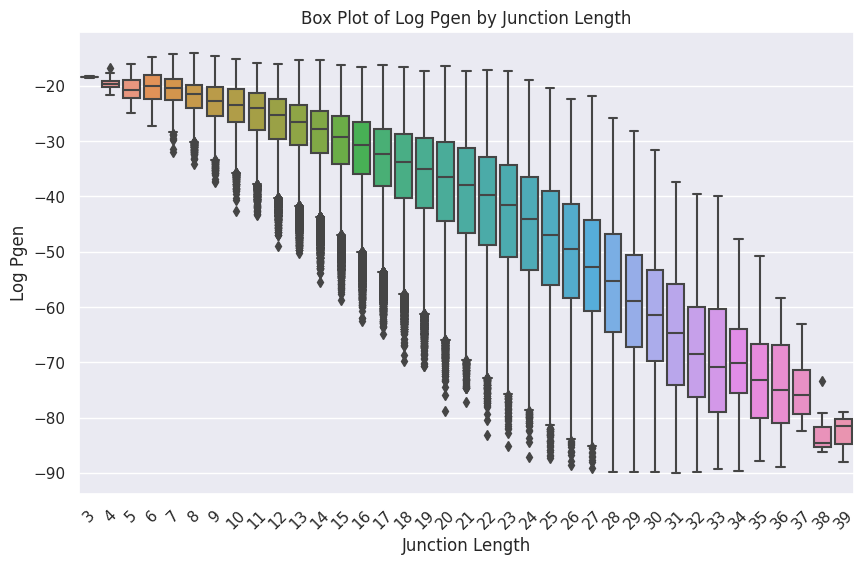

In [ ]:
# Create a box plot
plt.figure(figsize=(10, 6))
sns.boxplot(x="junction_length", y="log_pgen", data=filtered_df)
plt.title('Box Plot of Log Pgen by Junction Length')
plt.xlabel('Junction Length')
plt.ylabel('Log Pgen')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

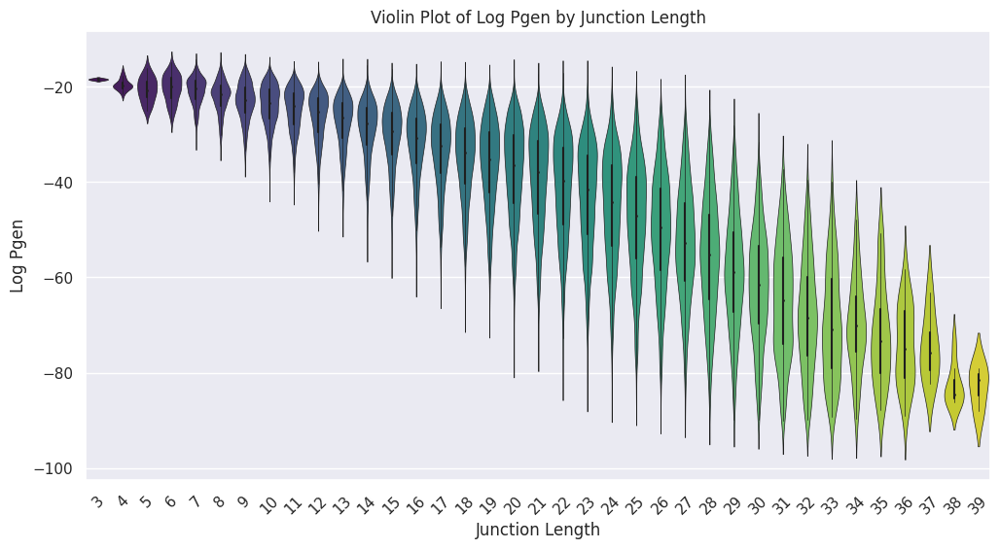

In [ ]:
# Create a violin plot
plt.figure(figsize=(12, 6))
sns.violinplot(x="junction_length", y="log_pgen", data=filtered_df, palette='viridis', linewidth=0.5, scale="width")
plt.title('Violin Plot of Log Pgen by Junction Length')
plt.xlabel('Junction Length')
plt.ylabel('Log Pgen')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility

plt.savefig(f'Violin Plot of Log Pgen by Junction Length.png')

plt.show()

## **Repertoires**

In [ ]:
print(len(filtered_df.repertoire_id.unique()))

count = filtered_df['repertoire_id'].value_counts()
print(count)

250
2892713941286916586-242ac113-0001-012    19388
2873730185838596586-242ac113-0001-012    16549
2918440795389956586-242ac113-0001-012    15294
3221665486487556586-242ac113-0001-012    15118
1047746754101308950-242ac113-0001-012    14877
                                         ...  
6084885090374324716-242ac114-0001-012        1
6054863268975284716-242ac114-0001-012        1
6078786236814004716-242ac114-0001-012        1
6066373781328564716-242ac114-0001-012        1
6067018026422964716-242ac114-0001-012        1
Name: repertoire_id, Length: 250, dtype: int64


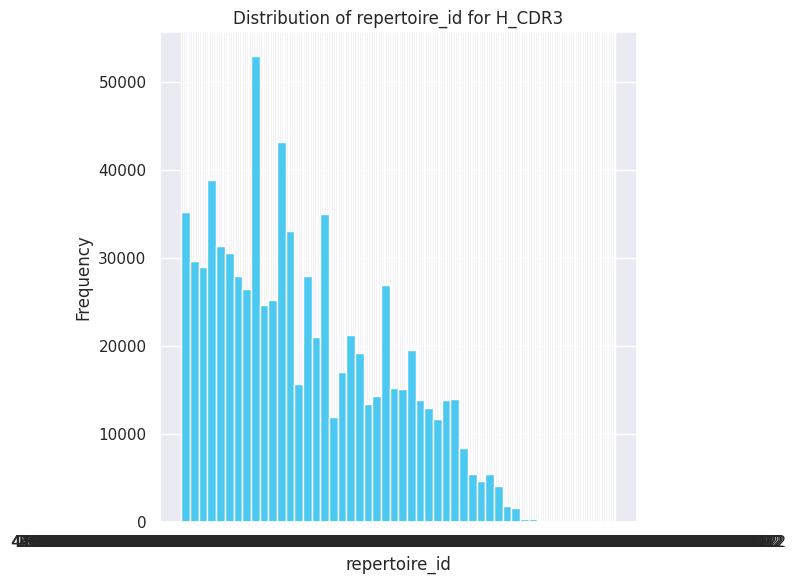

In [ ]:
label = 'repertoire_id'

data = filtered_df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
#plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

In [ ]:
print(count[0:16])

rep_ids = count[0:16].index

2892713941286916586-242ac113-0001-012    19388
2873730185838596586-242ac113-0001-012    16549
2918440795389956586-242ac113-0001-012    15294
3221665486487556586-242ac113-0001-012    15118
1047746754101308950-242ac113-0001-012    14877
1025069326778428950-242ac113-0001-012    14718
2804108765970436586-242ac113-0001-012    13953
2669762188951556586-242ac113-0001-012    13916
2644722529615876586-242ac113-0001-012    13423
2942020165844996586-242ac113-0001-012    13224
891281095508028950-242ac113-0001-012     12973
3203411875479556586-242ac113-0001-012    11637
1381079165943868950-242ac113-0001-012    11112
3046731468521476586-242ac113-0001-012    11035
3183182579515396586-242ac113-0001-012    10890
856577759756348950-242ac113-0001-012     10558
Name: repertoire_id, dtype: int64


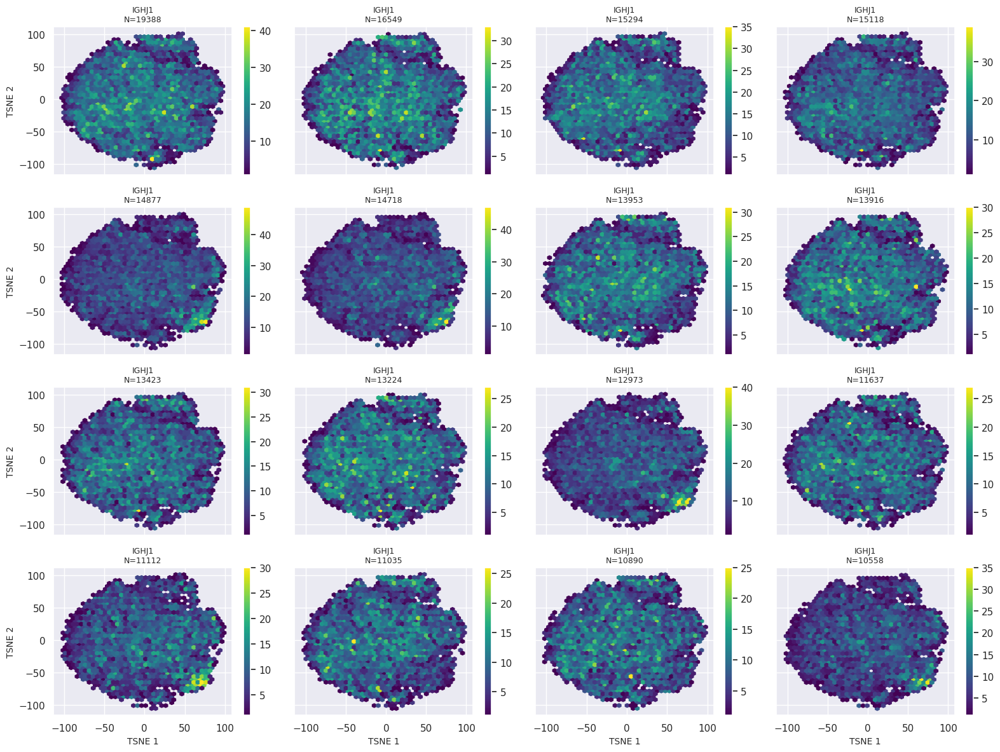

In [ ]:
label = 'repertoire_id'

x_dim = 4
y_dim = 4
gridsize = 40  # Adjust the gridsize as needed

fig, axes = plt.subplots(y_dim, x_dim, figsize=(16, 12), sharex='col', sharey='row')

c = 0

# Loop through the cutoff values and create hexbin plots
for i in range(y_dim):
    for j in range(x_dim):
        cutoff = rep_ids[c]
        c += 1

        ax = axes[i, j]
        x_data = filtered_df[filtered_df[label] == cutoff]['x']
        y_data = filtered_df[filtered_df[label] == cutoff]['y']

        hb = ax.hexbin(x_data, y_data, gridsize=gridsize, mincnt=1, cmap='viridis')
        num_data_points = len(x_data)
        ax.set_title(f'{el}\nN={num_data_points}', fontsize=9)
        plt.colorbar(hb, ax=ax)  # Add colorbar

# Add labels to the axes
for i in range(x_dim):
    axes[x_dim-1, i].set_xlabel(f'{red} 1', fontsize=10)
    axes[i, 0].set_ylabel(f'{red} 2', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()

plt.savefig(f'{model_name}_{red}_{dataset_name}_sep_by_{hue_name}.png')

# Show the plot
plt.show()

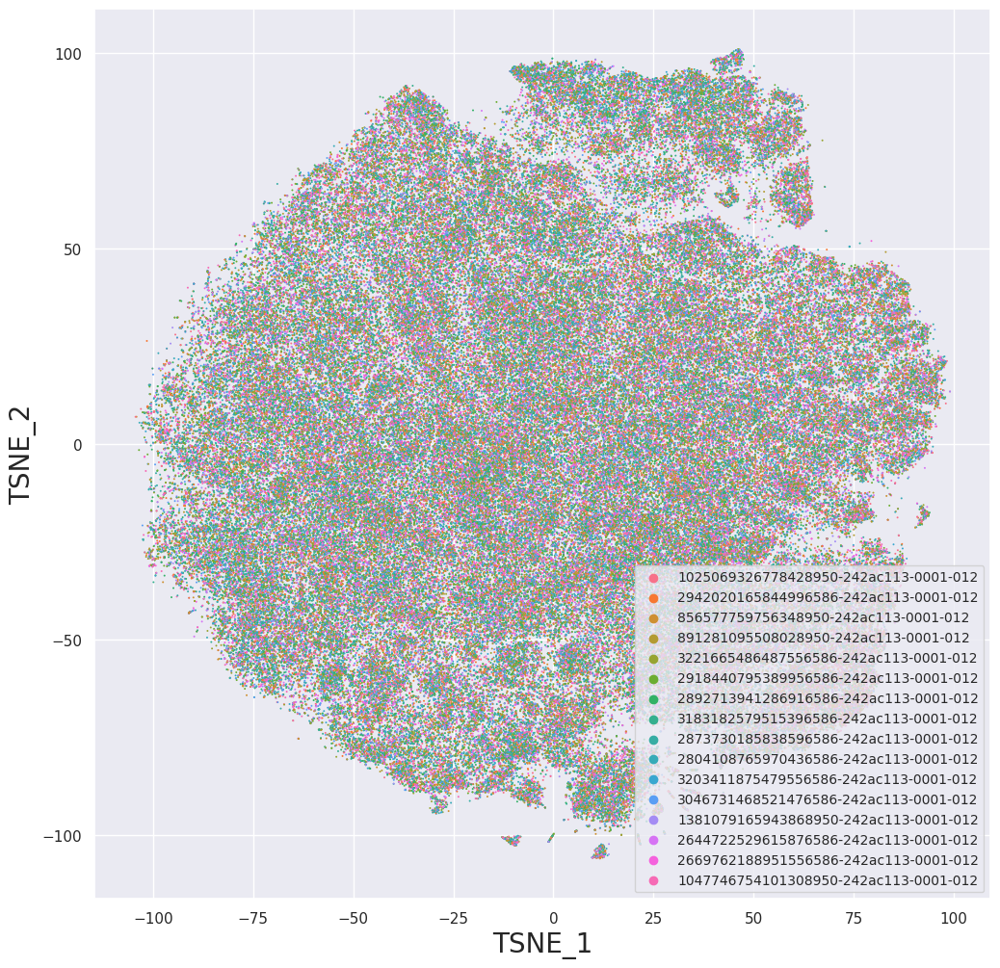

In [ ]:
# Define hue_name
hue_name = 'repertoire_id'

# Filter the DataFrame to include only the specified classes
filtered_df_filtered = filtered_df[filtered_df[hue_name].isin(rep_ids)]

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=filtered_df_filtered, x='x', y='y', s=2, linewidth=0, hue=hue_name)

# Set the legend
plt.legend(loc='lower right', fontsize='small')

# Set axes' names
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_{red}_{dataset_name}_{hue_name}.png')
plt.show()

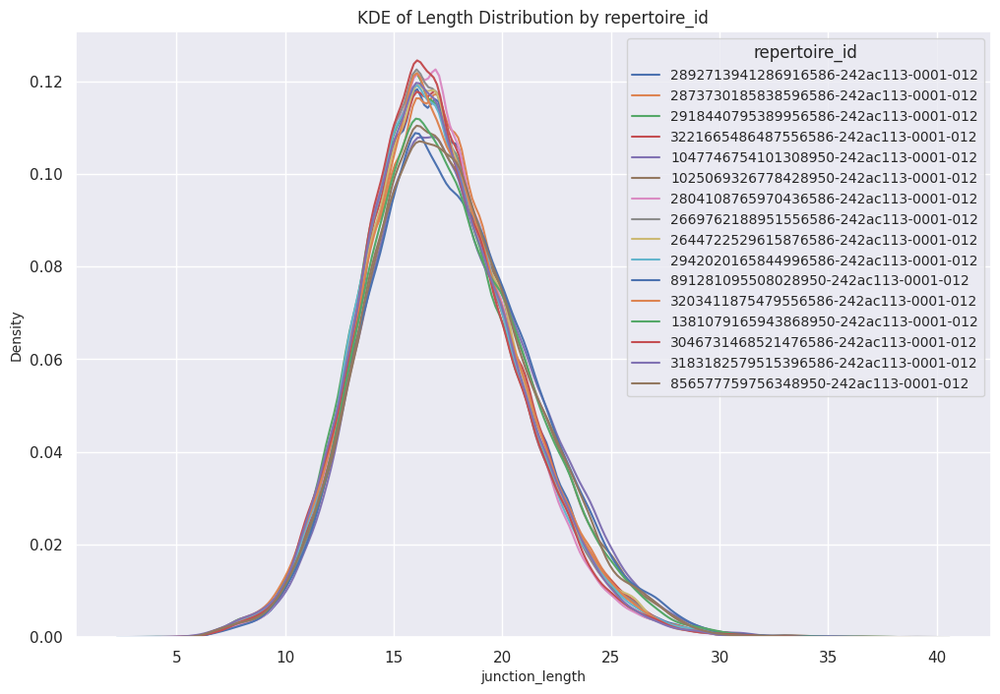

In [ ]:
# Define hue_name
hue_name = 'repertoire_id'
label = 'junction_length'

# Create a figure for the combined KDE plots
plt.figure(figsize=(12, 8))

# Loop through the cutoff values and create KDE plots
for cutoff in rep_ids:
    data = filtered_df[filtered_df[hue_name] == cutoff][label]

    sns.kdeplot(data, label=f'{cutoff}')

# Add labels and a legend
plt.xlabel('junction_length', fontsize=10)
plt.ylabel('Density', fontsize=10)
plt.title(f'KDE of Length Distribution by {hue_name}', fontsize=12)
plt.legend(title=hue_name, loc='upper right', fontsize='small')

# Save and show the plot
plt.savefig(f'{model_name}_{dataset_name}_kde_length_distr_by_{hue_name}.png')
plt.show()

# **Interactive length plots**

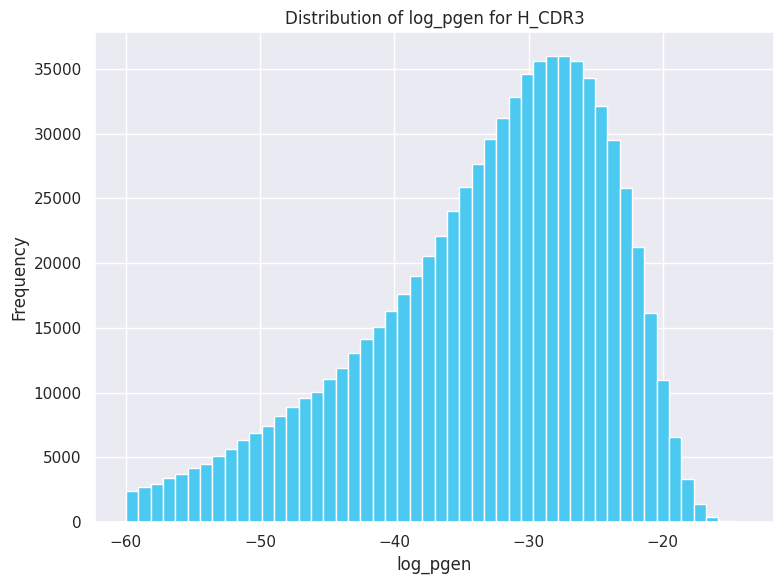

Max:  -14.017096638858614
Min:  -59.99997348303131


In [ ]:
label = 'log_pgen'

data = filtered_df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', filtered_df[label].max())
print('Min: ', filtered_df[label].min())

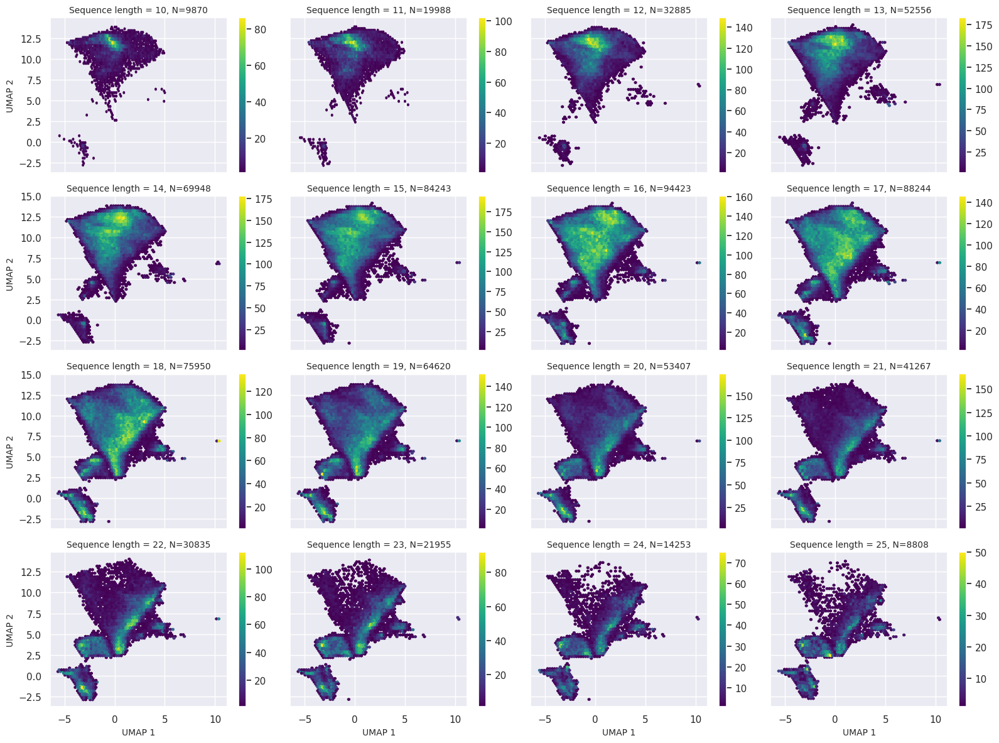

In [ ]:
cutoff_values = np.arange(10, 26, 1)
label = 'junction_length'

x_dim = 4
y_dim = 4
alpha = 0.05
gridsize = 70  # Adjust the gridsize as needed

fig, axes = plt.subplots(y_dim, x_dim, figsize=(16, 12), sharex='col', sharey='row')

c = 0

# Loop through the cutoff values and create hexbin plots
for i in range(y_dim):
    for j in range(x_dim):
        cutoff = cutoff_values[c]
        c += 1

        ax = axes[i, j]
        x_data = filtered_df[filtered_df[label] == cutoff]['x']
        y_data = filtered_df[filtered_df[label] == cutoff]['y']

        hb = ax.hexbin(x_data, y_data, gridsize=gridsize, mincnt=1, cmap='viridis')
        num_data_points = len(x_data)
        ax.set_title(f'Sequence length = {cutoff}, N={num_data_points}', fontsize=10)
        plt.colorbar(hb, ax=ax)  # Add colorbar

# Add labels to the axes
for i in range(x_dim):
    axes[x_dim-1, i].set_xlabel('UMAP 1', fontsize=10)
    axes[i, 0].set_ylabel('UMAP 2', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()

plt.savefig(f'{model_name}_{label}_{dataset_name}_hexbin.png')

# Show the plot
plt.show()

## **Divide by one label and color by another one**

In [ ]:
new_filtered_df = filtered_df[(filtered_df['log_pgen'] >= -60)]

In [ ]:
cutoff_values = np.arange(10, 26, 1)
len(cutoff_values)

16

<ipython-input-170-dd452d279bd0>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  original_cmap = cm.get_cmap(cmap_name)


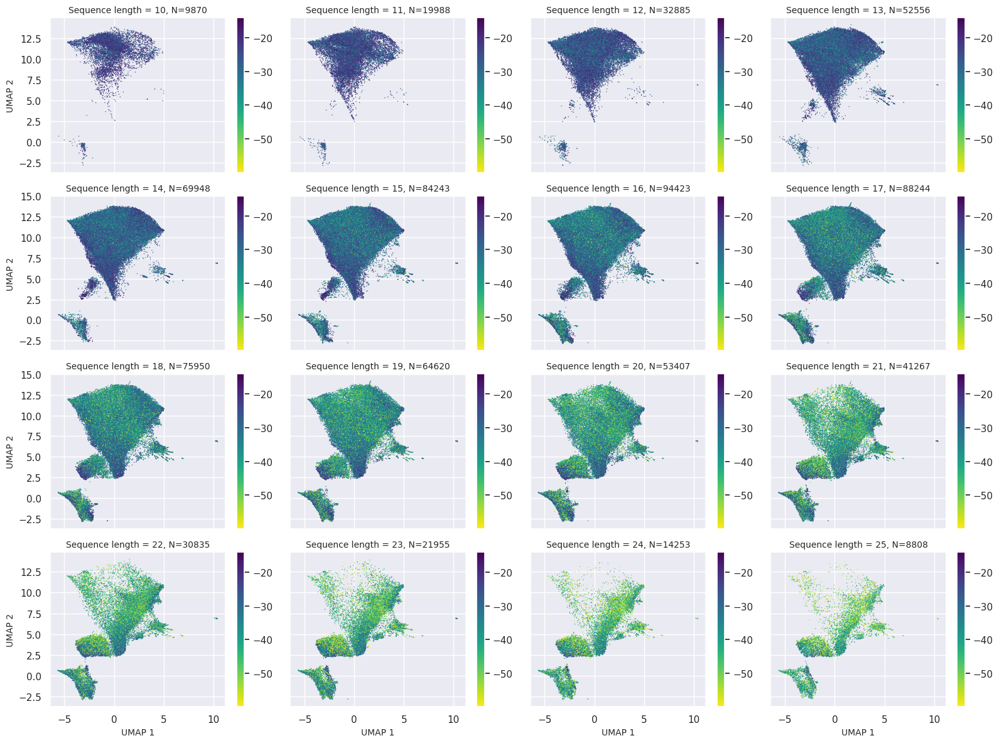

In [ ]:
label = 'junction_length'
hue_name = 'log_pgen'
cmap_name = 'viridis'

original_cmap = cm.get_cmap(cmap_name)

# Reverse the colormap
reversed_cmap = mcolors.ListedColormap(original_cmap.colors[::-1])

x_dim = 4
y_dim = 4

fig, axes = plt.subplots(y_dim, x_dim, figsize=(16, 12), sharex='col', sharey='row')

c = 0

# Calculate the overall min and max values for 'log_pgen' in filtered_df
global_min_log_pgen = new_filtered_df[hue_name].min()
global_max_log_pgen = new_filtered_df[hue_name].max()

# Create a consistent normalization object for the global color scale
norm = plt.Normalize(vmin=global_min_log_pgen, vmax=global_max_log_pgen)

# Create a single colorbar using the consistent normalization
sm = cm.ScalarMappable(cmap=reversed_cmap, norm=norm)
sm.set_array([])

# Loop through the cutoff values and create scatter plots
for i in range(y_dim):
    for j in range(x_dim):
        cutoff = cutoff_values[c]
        c += 1

        ax = axes[i, j]

        # Filter the data based on the 'junction_length' value
        subset = new_filtered_df[new_filtered_df[label] == cutoff]

        # Create the scatterplot
        scatter = sns.scatterplot(data=subset, x='x', y='y', s=1, linewidth=0, c=subset[hue_name], cmap=reversed_cmap, ax=ax, norm=norm)

        num_data_points = len(subset)
        ax.set_title(f'Sequence length = {cutoff}, N={num_data_points}', fontsize=10)

        # Add the consistent colorbar for 'hue_name'
        cbar = plt.colorbar(sm, label='', ax=ax)

        # Add a legend to the plot
        ax.legend().remove()

# Add labels to the axes
for i in range(x_dim):
    axes[x_dim-1, i].set_xlabel('UMAP 1', fontsize=10)
for i in range(y_dim):
    axes[i, 0].set_ylabel('UMAP 2', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()

# Add a single legend for the entire plot
#handles, labels = scatter.get_legend_handles_labels()
#fig.legend(handles, labels, loc='center right', title=hue_name)

plt.savefig(f'{model_name}_sep_{label}_col_{hue_name}_{dataset_name}_scatter.png')

# Show the plot
plt.show()


## **Plots for continuous values**

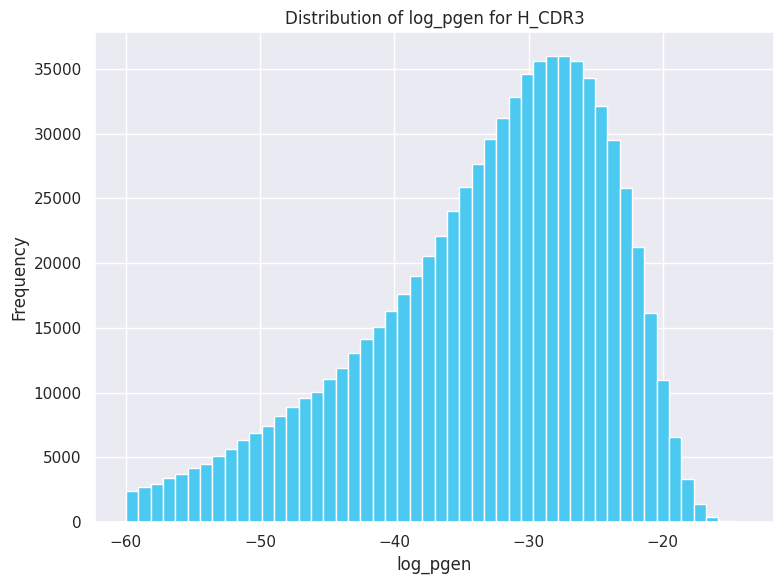

Max:  -14.017096638858614
Min:  -59.99997348303131


In [ ]:
label = 'log_pgen'

data = filtered_df[label]

# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(data, bins=50, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of {label} for {dataset_name}')
ax.set_xlabel(f'{label}')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_{label}_in_{dataset_name}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

print('Max: ', filtered_df[label].max())
print('Min: ', filtered_df[label].min())

In [ ]:
# Calculate the bins for junction lengths with a bin width of bin_width
bin_width = 3
filtered_df['log_pgen_bin'] = (filtered_df['log_pgen'] // bin_width) * bin_width
filtered_df['log_pgen_bin'] = filtered_df['log_pgen_bin'].astype(int)

In [ ]:
len(filtered_df['log_pgen_bin'].unique())

16

In [ ]:
np.sort(filtered_df['log_pgen_bin'].unique())

array([-60, -57, -54, -51, -48, -45, -42, -39, -36, -33, -30, -27, -24,
       -21, -18, -15])

In [ ]:
cutoff_values = np.arange(-15, -63, -3)
print(cutoff_values)
len(cutoff_values)

[-15 -18 -21 -24 -27 -30 -33 -36 -39 -42 -45 -48 -51 -54 -57 -60]


16

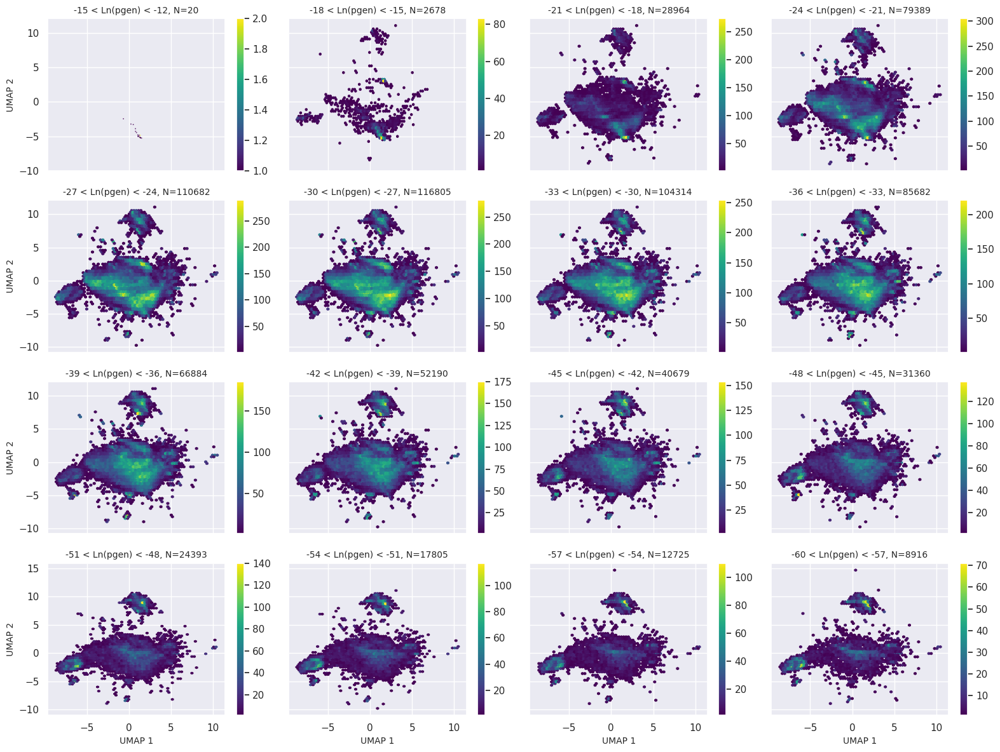

In [ ]:
label = 'log_pgen_bin'

x_dim = 4
y_dim = 4
alpha = 0.05
gridsize = 70  # Adjust the gridsize as needed

fig, axes = plt.subplots(y_dim, x_dim, figsize=(16, 12), sharex='col', sharey='row')

c = 0

# Loop through the cutoff values and create hexbin plots
for i in range(y_dim):
    for j in range(x_dim):
        cutoff = cutoff_values[c]
        c += 1

        ax = axes[i, j]
        x_data = filtered_df[filtered_df[label] == cutoff]['x']
        y_data = filtered_df[filtered_df[label] == cutoff]['y']

        hb = ax.hexbin(x_data, y_data, gridsize=gridsize, mincnt=1, cmap='viridis')
        num_data_points = len(x_data)
        ax.set_title(f'{cutoff} < Ln(pgen) < {cutoff+3}, N={num_data_points}', fontsize=10)
        plt.colorbar(hb, ax=ax)  # Add colorbar

# Add labels to the axes
for i in range(x_dim):
    axes[x_dim-1, i].set_xlabel('UMAP 1', fontsize=10)
for i in range(y_dim):
    axes[i, 0].set_ylabel('UMAP 2', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()

plt.savefig(f'{model_name}_{label}_{dataset_name}_hexbin.png')

# Show the plot
plt.show()

# **Random sequences generation and analysis**

In [16]:
df = pd.read_csv(f'drive/MyDrive/Oslo/data/paper/FASTA/combined_cdr3_heavy.csv', sep=';')
df['junction_length'] = df['seq'].apply(len)

filtered_df = df[(df['junction_length'] <= 15)]

# Remove duplicates based on the 'junction_aa' column
filtered_df = filtered_df.drop_duplicates(subset='seq', keep='first')

filtered_df

,index,seq,junction_length
0,1,ASGAVTDFVY,10
1,2,AKEGPLYSSGYYFDY,15
2,3,TTDRTHYYDSFY,12
3,4,SHQIDYHYRMDF,12
5,6,ARDAMTTIPRFDS,13
...,...,...,...
794606,794607,ARDLNGGYGGGYFDC,15
794607,794608,DVSYFDSPGYYYFDY,15
794615,794616,VKDLYSGRFYYFLDD,15
794618,794619,VLLTVLTPDDAFDI,14


In [5]:
from collections import Counter
import random


# Create a dictionary to store amino acid probs for each length
amino_acid_frequencies = {}

# Get the unique junction lengths
unique_lengths = filtered_df["junction_length"].unique()

# Iterate through unique junction lengths and calculate amino acid frequencies
for length in unique_lengths:
    sequences = filtered_df[filtered_df["junction_length"] == length]["seq"]
    position_probabilities = []  # Use probabilities instead of frequencies

    for i in range(length):
        amino_acids = [seq[i] for seq in sequences]
        amino_acid_frequency = dict(Counter(amino_acids))
        total_counts = sum(amino_acid_frequency.values())
        amino_acid_probabilities = {aa: count / total_counts for aa, count in amino_acid_frequency.items()}
        position_probabilities.append(amino_acid_probabilities)

    amino_acid_frequencies[length] = position_probabilities  # Store probabilities instead of frequencies

# Create a list to store the generated random sequences
random_sequences = []

# Create a list to store sequences for the CSV file
csv_data = []

# Iterate through each sequence in filtered_df
for index, row in filtered_df.iterrows():
    junction_length = row["junction_length"]
    probabilities = amino_acid_frequencies[junction_length]

    random_sequence = ""
    for i in range(junction_length):
        amino_acids = list(probabilities[i].keys())
        probabilities_list = list(probabilities[i].values())
        random_aa = random.choices(amino_acids, probabilities_list)[0]
        random_sequence += random_aa

    random_sequences.append(random_sequence)
    csv_data.append({"id": index, "seq": random_sequence})



# Save the generated random sequences as a FASTA file
with open("random_aa_matrix_L_CDR3.fa", "w") as fasta_file:
    for i, sequence in enumerate(random_sequences):
        header = f">{i + 1}"
        fasta_file.write(f"{header}\n{sequence}\n")

# Save the random sequences as a CSV file
csv_df = pd.DataFrame(csv_data)
csv_df.to_csv("random_aa_matrix_L_CDR3.csv", index=False, sep=';')

KeyboardInterrupt: ignored

In [17]:
# check

df1 = pd.read_csv(f'drive/MyDrive/Oslo/data/paper/FASTA/combined_cdr3_heavy.csv', sep=';')
df1 = df1.rename(columns={'seq': 'junction_aa'})
df1['junction_length'] = df1['junction_aa'].apply(len)
df1 = df1[(df1['junction_length'] <= 40)]


df2 = pd.read_csv('drive/MyDrive/Oslo/data/paper/FASTA/random_aa_matrix_H_CDR3.csv', sep=';')
df2 = df2.rename(columns={'seq': 'junction_aa'})
df2['junction_length'] = df2['junction_aa'].apply(len)
df2 = df2[(df2['junction_length'] <= 40)]


df3 = pd.read_csv('drive/MyDrive/Oslo/data/ireceptor/H_CDR3.csv', sep=';')
df3 = df3.drop('junction_aa', axis=1)
df3 = df3.rename(columns={'cdr3_aa': 'junction_aa'})
df3['junction_length'] = df3['junction_aa'].apply(len)
df3 = df3[(df3['junction_length'] <= 40)]


# Function to calculate amino acid frequencies
def calculate_aa_frequencies(df):
    amino_acid_frequencies = {}
    unique_lengths = df["junction_length"].unique()

    for length in unique_lengths:
        sequences = df[df["junction_length"] == length]["junction_aa"]
        position_frequencies = []

        for i in range(length):
            amino_acids = [seq[i] for seq in sequences]
            amino_acid_frequency = dict(Counter(amino_acids))

            # Sort the amino acid keys for consistent order
            sorted_frequency = {aa: amino_acid_frequency[aa] for aa in sorted(amino_acid_frequency.keys())}

            total_counts = sum(sorted_frequency.values())
            amino_acid_probabilities = {aa: count / total_counts for aa, count in sorted_frequency.items()}
            position_frequencies.append(amino_acid_probabilities)

        amino_acid_frequencies[length] = position_frequencies

    return amino_acid_frequencies

# Calculate amino acid frequencies for each dataframe
amino_acid_frequencies_df1 = calculate_aa_frequencies(df1)
amino_acid_frequencies_df2 = calculate_aa_frequencies(df2)
amino_acid_frequencies_df3 = calculate_aa_frequencies(df3)

# Compare the amino acid frequencies
for length in amino_acid_frequencies_df1.keys():
    for i in range(len(amino_acid_frequencies_df1[length])):
        frequencies1 = amino_acid_frequencies_df1[length][i]
        frequencies2 = amino_acid_frequencies_df2[length][i]
        frequencies3 = amino_acid_frequencies_df3[length][i]

        # Compare the frequencies for the two dataframes
        # You can define a similarity measure based on your specific criteria
        # Here, we're simply printing the results for illustration
        print(f"Sequence Length: {length}, Position {i}:")
        print("DataFrame 1 Frequencies:", frequencies1)
        print("DataFrame 2 Frequencies:", frequencies2)
        print("DataFrame 3 Frequencies:", frequencies3)
        print()

Sequence Length: 10, Position 0:
DataFrame 1 Frequencies: {'A': 0.8111830163365165, 'C': 0.000986504616841607, 'D': 0.00015784073869465709, 'E': 0.0009075842474942782, 'F': 0.0011838055402099282, 'G': 0.014047825743824481, 'H': 0.0005524425854312998, 'I': 0.003906558282692763, 'K': 0.00019730092336832136, 'L': 0.003196274958566806, 'M': 0.0013416462789045853, 'N': 0.0016178675716202351, 'P': 0.00039460184673664273, 'Q': 0.0007497435087996212, 'R': 0.002288690711072528, 'S': 0.013889985005129824, 'T': 0.07047588982716439, 'V': 0.07126509352063767, 'W': 0.0006313629547786283, 'Y': 0.0010259648015152711}
DataFrame 2 Frequencies: {'A': 0.8159182384973561, 'C': 0.0009075842474942782, 'D': 0.00011838055402099282, 'E': 0.000868124062820614, 'F': 0.0010259648015152711, 'G': 0.013495383158393182, 'H': 0.0008286638781469497, 'I': 0.004182779575408413, 'K': 0.00015784073869465709, 'L': 0.003038434219872149, 'M': 0.0013811064635782496, 'N': 0.0020519296030305422, 'P': 0.0002762212927156499, 'Q': 0

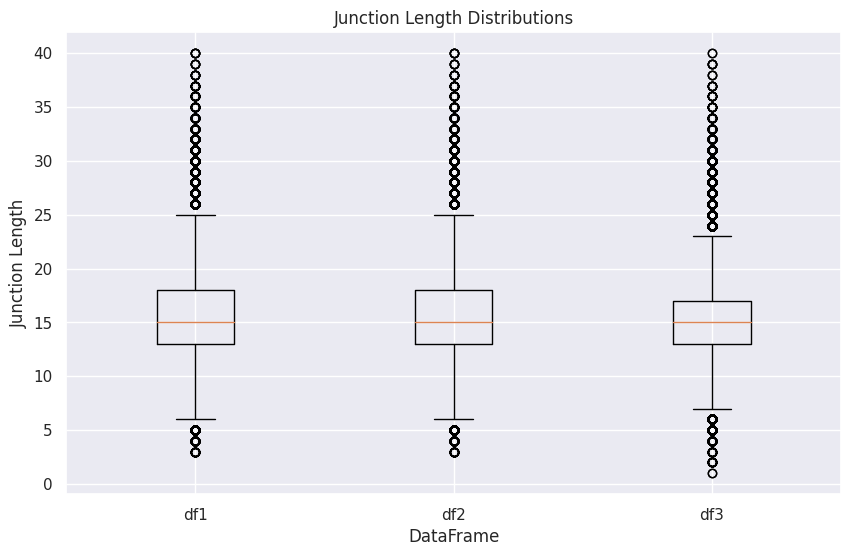

In [18]:
# Extract the 'junction_length' column from each DataFrame
junction_length_df1 = df1['junction_length']
junction_length_df2 = df2['junction_length']
junction_length_df3 = df3['junction_length']

# Create a list of the extracted columns
data = [junction_length_df1, junction_length_df2, junction_length_df3]

# Create a labels list to identify each dataset
labels = ['df1', 'df2', 'df3']

# Create a boxplot to compare the distributions
plt.figure(figsize=(10, 6))
plt.boxplot(data, labels=labels)
plt.title('Junction Length Distributions')
plt.xlabel('DataFrame')
plt.ylabel('Junction Length')
plt.show()

In [22]:
# Define a function to calculate Euclidean distance between two probability vectors
def euclidean_distance(vector1, vector2):
    return np.linalg.norm(vector1 - vector2)

# Calculate amino acid frequencies for each dataframe
amino_acid_frequencies_df1 = calculate_aa_frequencies(df1)
amino_acid_frequencies_df2 = calculate_aa_frequencies(df2)
amino_acid_frequencies_df3 = calculate_aa_frequencies(df3)

# Initialize lists to store the distances
distances_1_2 = []
distances_1_3 = []
distances_2_3 = []

# Compare the amino acid frequencies
for length in amino_acid_frequencies_df1.keys():
    for i in range(len(amino_acid_frequencies_df1[length])):
        frequencies1 = list(amino_acid_frequencies_df1[length][i].values())
        frequencies2 = list(amino_acid_frequencies_df2[length][i].values())
        frequencies3 = list(amino_acid_frequencies_df3[length][i].values())

        # Ensure that all vectors have the same dimension by padding with zeros
        max_dimension = max(len(frequencies1), len(frequencies2), len(frequencies3))
        frequencies1 += [0] * (max_dimension - len(frequencies1))
        frequencies2 += [0] * (max_dimension - len(frequencies2))
        frequencies3 += [0] * (max_dimension - len(frequencies3))

        # Calculate the Euclidean distances between the probability vectors
        distance_1_2 = euclidean_distance(np.array(frequencies1), np.array(frequencies2))
        distance_1_3 = euclidean_distance(np.array(frequencies1), np.array(frequencies3))
        distance_2_3 = euclidean_distance(np.array(frequencies2), np.array(frequencies3))

        distances_1_2.append(distance_1_2)
        distances_1_3.append(distance_1_3)
        distances_2_3.append(distance_2_3)

# Calculate the mean distances for each combination
mean_distance_1_2 = np.mean(distances_1_2)
mean_distance_1_3 = np.mean(distances_1_3)
mean_distance_2_3 = np.mean(distances_2_3)

# Display the mean distances
print("Mean Distance from DataFrame 1 to DataFrame 2:", mean_distance_1_2)
print("Mean Distance from DataFrame 1 to DataFrame 3:", mean_distance_1_3)
print("Mean Distance from DataFrame 2 to DataFrame 3:", mean_distance_2_3)

Mean Distance from DataFrame 1 to DataFrame 2: 0.17631802316815456
Mean Distance from DataFrame 1 to DataFrame 3: 0.250667318581895
Mean Distance from DataFrame 2 to DataFrame 3: 0.25424905849887536


In [ ]:
import random
import string

# Initialize an empty list to store the generated random sequences
random_sequences = []

# Generate random amino acid sequences of the same length as each sequence in the existing DataFrame
for _, row in df.iterrows():
    sequence_length = len(row['seq'])
    random_sequence = ''.join(random.choice('ACDEFGHIKLMNPQRSTVWY') for _ in range(sequence_length))
    random_sequences.append(random_sequence)

# Create a new DataFrame with the generated random sequences
random_df = pd.DataFrame({'seq': random_sequences})
random_df.to_csv(f'random_{chain}_{segment}.csv', sep=';', index=True)

# Add a column with seq lengths
random_df['seq_length'] = random_df['seq'].apply(len)

random_df

,seq,seq_length
0,MDKAHWNGLV,10
1,HMDYPSVMVFHEIIW,15
2,WMKYVTEGVRWP,12
3,GAYSMTILYSPA,12
4,MQHEDMQGFADTTGYATRDQ,20
...,...,...
794615,FGMGTLVKIAFPLKN,15
794616,ICQHEGELCPGKMYSN,16
794617,ACVYMYNSNDNLGQKVT,17
794618,PFWSLMRMEKFESP,14


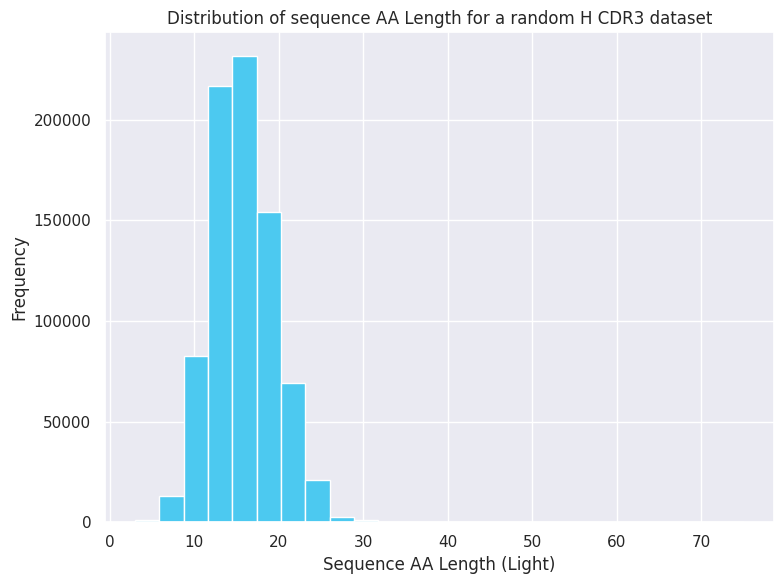

In [ ]:
# Create a separate figure for each plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the histogram
ax.hist(random_df['seq_length'], bins=25, alpha=1, color='#4CC9F0')
ax.set_title(f'Distribution of sequence AA Length for a random {chain} {segment} dataset')
ax.set_xlabel('Sequence AA Length (Light)')
ax.set_ylabel('Frequency')

# Save the plot with a unique filename
filename = f'Distribution_of_sequence_AA_Length_random_{chain}_{segment}.png'
plt.savefig(filename)

# Adjust layout to prevent overlapping titles
plt.tight_layout()

# Show the plots
plt.show()

In [ ]:
with open(f'random_{chain}_{segment}.fa', 'w') as fasta_file:
    for idx, row in random_df.iterrows():
        sequence_identifier = f">{idx}"  # Create an identifier using the row index
        sequence = row['seq']
        fasta_file.write(f"{sequence_identifier}\n{sequence}\n")

# **Random sequences length plots**

In [ ]:
chain = 'H'
segment = 'CDR3'
model_name = 'prott5'
dataset_name = f'{chain}_{segment}'

In [ ]:
umap_df = pd.DataFrame(pd.read_pickle(f'drive/MyDrive/Oslo/output/{model_name}/UMAP_RANDOM_{dataset_name}.pkl').values)
umap_df.columns = ['x', 'y']
umap_df['id'] = range(1, len(umap_df) + 1)

metadata_df = pd.read_csv(f'drive/MyDrive/Oslo/data/random/random_{dataset_name}.csv', sep=';')
metadata_df['id'] = range(1, len(metadata_df) + 1)
metadata_df['seq_length'] = metadata_df['seq'].apply(len)
#merged_df = pd.merge(metadata_df, umap_df, right_index=True, left_index=True)
merged_df = pd.merge(metadata_df, umap_df, on='id')

merged_df

,index,seq,id,seq_length,x,y
0,0,MDKAHWNGLV,1,10,0.196873,-3.927869
1,1,HMDYPSVMVFHEIIW,2,15,0.969148,3.252939
2,2,WMKYVTEGVRWP,3,12,-1.195697,2.777725
3,3,GAYSMTILYSPA,4,12,0.269078,4.008606
4,4,MQHEDMQGFADTTGYATRDQ,5,20,2.086499,-4.375943
...,...,...,...,...,...,...
794615,794615,FGMGTLVKIAFPLKN,794616,15,1.677730,6.172611
794616,794616,ICQHEGELCPGKMYSN,794617,16,3.943135,0.587948
794617,794617,ACVYMYNSNDNLGQKVT,794618,17,1.551691,-0.805782
794618,794618,PFWSLMRMEKFESP,794619,14,-1.402779,2.458203


In [ ]:
if chain == 'L':
  filtered_df = merged_df[merged_df['seq_length'] <= 20]
else:
  filtered_df = merged_df[merged_df['seq_length'] <= 30]

filtered_df

,index,seq,id,seq_length,x,y
0,0,MDKAHWNGLV,1,10,0.196873,-3.927869
1,1,HMDYPSVMVFHEIIW,2,15,0.969148,3.252939
2,2,WMKYVTEGVRWP,3,12,-1.195697,2.777725
3,3,GAYSMTILYSPA,4,12,0.269078,4.008606
4,4,MQHEDMQGFADTTGYATRDQ,5,20,2.086499,-4.375943
...,...,...,...,...,...,...
794615,794615,FGMGTLVKIAFPLKN,794616,15,1.677730,6.172611
794616,794616,ICQHEGELCPGKMYSN,794617,16,3.943135,0.587948
794617,794617,ACVYMYNSNDNLGQKVT,794618,17,1.551691,-0.805782
794618,794618,PFWSLMRMEKFESP,794619,14,-1.402779,2.458203


<ipython-input-48-3c4b77c41038>:15: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, label=hue_name)


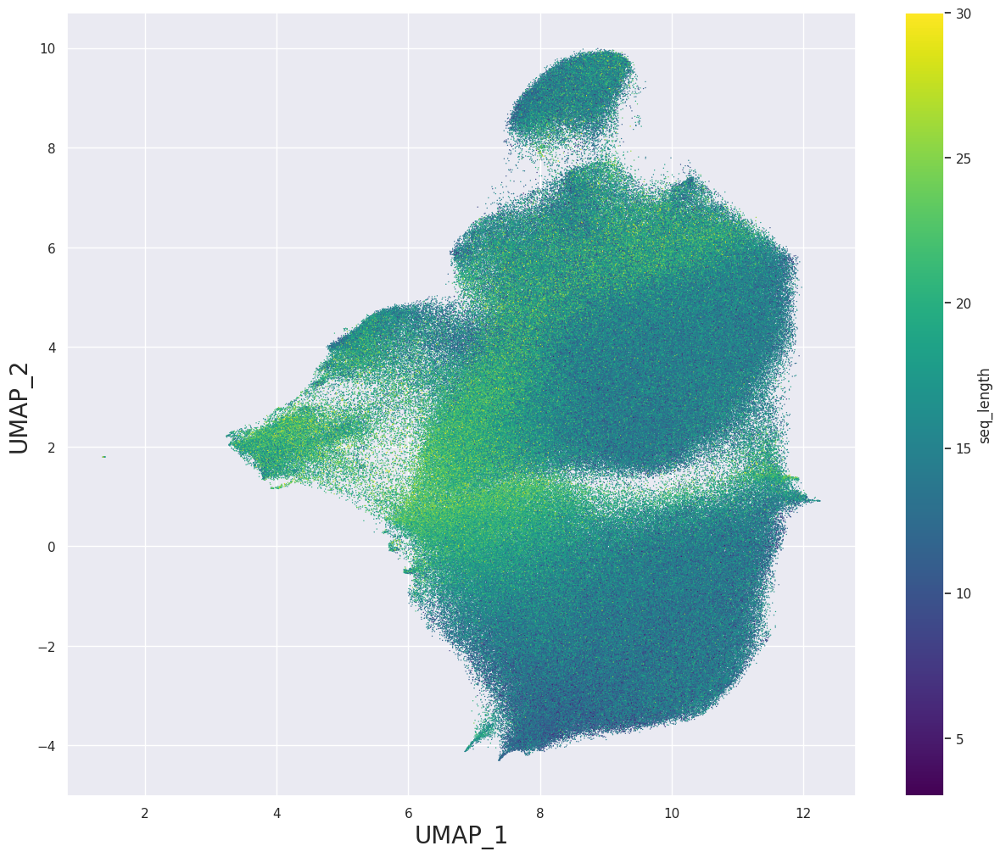

In [ ]:
import matplotlib.cm as cm

hue_name = 'seq_length'
cmap_name = 'viridis'

# Create the scatterplot
plt.figure(figsize=(15, 12))
scatter = sns.scatterplot(data=filtered_df, x='x', y='y', s=1, linewidth=0, c=filtered_df[hue_name], cmap=cmap_name)

# Create a ScalarMappable for the colorbar
sm = cm.ScalarMappable(cmap=cmap_name, norm=plt.Normalize(vmin=filtered_df[hue_name].min(), vmax=filtered_df[hue_name].max()))
sm.set_array([])  # You need to set an empty array for it to work

# Add a colorbar for 'mu_freq_heavy'
cbar = plt.colorbar(sm, label=hue_name)

# Set axes' names
plt.xlabel('UMAP_1', fontsize=20)
plt.ylabel('UMAP_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_UMAP_RANDOM_{dataset_name}_{hue_name}.png')
plt.show()

In [ ]:
if chain == 'L':
  length_df = filtered_df[(filtered_df['seq_length'] == 8)]
else:
  length_df = filtered_df[(filtered_df['seq_length'] == 15)]

length_df

,index,seq,id,seq_length,x,y
1,1,HMDYPSVMVFHEIIW,2,15,0.969148,3.252939
6,6,CQGTRATREKEASIF,7,15,-1.551983,-0.846021
9,9,CELILMAINPKNEWM,10,15,0.736831,1.960343
13,13,FGNFKICDGCMKEFY,14,15,5.417612,-0.069419
19,19,DMPRRHHMEHRAKPC,20,15,-0.413242,-1.746988
...,...,...,...,...,...,...
794597,794597,SNMMHIEWEDNFFCM,794598,15,-0.323323,1.618869
794604,794604,TSKLYYCMTGPGLHF,794605,15,0.583955,6.696239
794606,794606,SKCIGGITLDPGDST,794607,15,-1.031928,0.408527
794607,794607,MLVERWCGFREHHWG,794608,15,1.241613,-3.893241


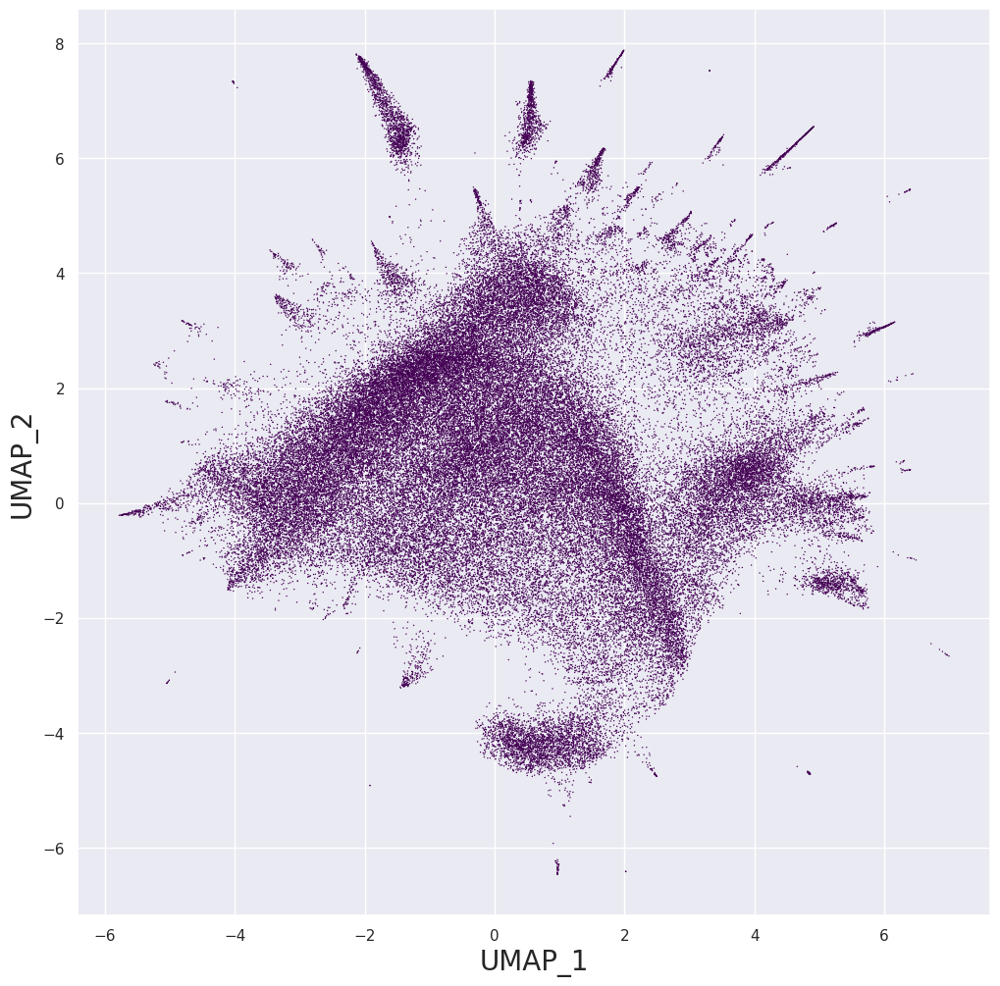

In [ ]:
import matplotlib.cm as cm

hue_name = 'seq_length'
cmap_name = 'viridis'

# Create the scatterplot
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=length_df, x='x', y='y', s=1, linewidth=0, c=length_df[hue_name], cmap=cmap_name)

# Create a ScalarMappable for the colorbar
sm = cm.ScalarMappable(cmap=cmap_name, norm=plt.Normalize(vmin=length_df[hue_name].min(), vmax=length_df[hue_name].max()))
sm.set_array([])  # You need to set an empty array for it to work

# Add a colorbar for 'mu_freq_heavy'
#cbar = plt.colorbar(sm, label=hue_name)

# Set axes' names
plt.xlabel('UMAP_1', fontsize=20)
plt.ylabel('UMAP_2', fontsize=20)

# Save and show the plot
plt.savefig(f'{model_name}_UMAP_RANDOM_len=15_{dataset_name}_{hue_name}.png')
plt.show()

In [ ]:
!zip -r /content/tsne.zip /content/*TSNE*

  adding: content/esm2_TSNE_H_CDR3_d_family.png (deflated 0%)
  adding: content/esm2_TSNE_H_CDR3_hexbin_sep_by_d_family.png (deflated 2%)
  adding: content/esm2_TSNE_H_CDR3_hexbin_sep_by_j_family.png (deflated 3%)
  adding: content/esm2_TSNE_H_CDR3_hexbin_sep_by_v_family.png (deflated 2%)
  adding: content/esm2_TSNE_H_CDR3_j_family.png (deflated 0%)
  adding: content/esm2_TSNE_H_CDR3_junction_length.png (deflated 0%)
  adding: content/esm2_TSNE_H_CDR3_log_pgen.png (deflated 0%)
  adding: content/esm2_TSNE_H_CDR3_sep_by_junction_length.png (deflated 1%)
  adding: content/esm2_TSNE_H_CDR3_v_family.png (deflated 0%)


# **TSNE and PCA plots for CDR3**

In [ ]:
!rm *

rm: cannot remove 'drive': Is a directory
rm: cannot remove 'sample_data': Is a directory


In [ ]:
model_name = 'esm2'
data = 'RANDOM_AA'
chain = 'L'
red = 'TSNE'

if data == 'RANDOM':
  df = pd.read_pickle(f'drive/MyDrive/Oslo/data/paper/output/{model_name}/{red}_RANDOM_{chain}_CDR3.pkl')
elif data == 'REAL':
  df = pd.read_pickle(f'drive/MyDrive/Oslo/data/paper/output/{model_name}/{red}_{chain}_CDR3.pkl')
elif data == 'RANDOM_AA':
  df = pd.read_pickle(f'drive/MyDrive/Oslo/data/paper/output/{model_name}/{red}_random_aa_matrix_{chain}_CDR3.pkl')

df

,0,1
0,48.920475,-17.869160
1,98.888138,-4.533267
2,7.222396,-45.786087
3,47.686298,50.626358
4,64.784325,-39.277969
...,...,...
224811,52.199638,77.672974
224812,45.417885,-46.274117
224813,34.128418,7.713087
224814,-42.580315,-53.027992


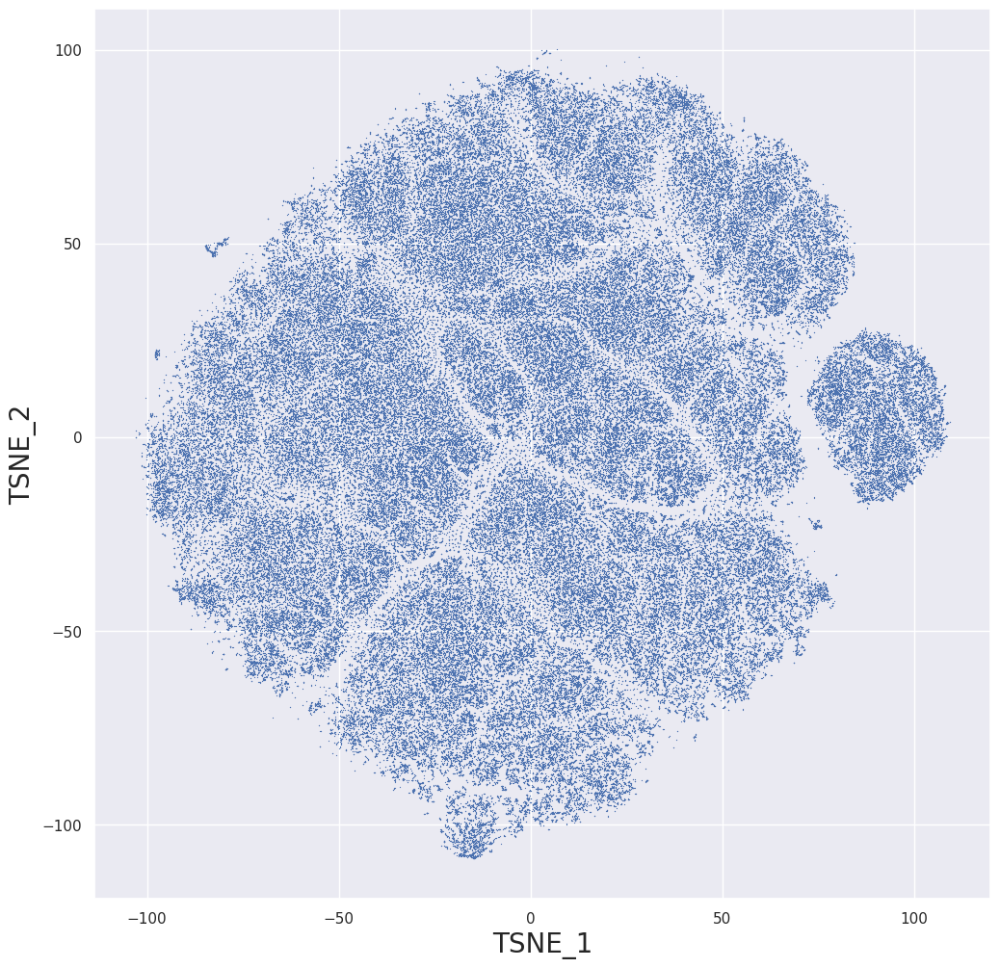

In [ ]:
plt.figure(figsize=(12, 12))
scatter = sns.scatterplot(data=df, x=df.iloc[:,0].values, y=df.iloc[:,1].values, s=0.8, linewidth=0)
plt.xlabel(f'{red}_1', fontsize=20)
plt.ylabel(f'{red}_2', fontsize=20)

output_file = f'{model_name}_{data}_{chain}_CDR3_{red}'
plt.savefig(f'{output_file}')

In [ ]:
!ls drive/MyDrive/Oslo/data/ireceptor/output/esm2

H_CDR3.pt  old	TSNE_H_CDR3.pkl  UMAP_H_CDR3.pkl


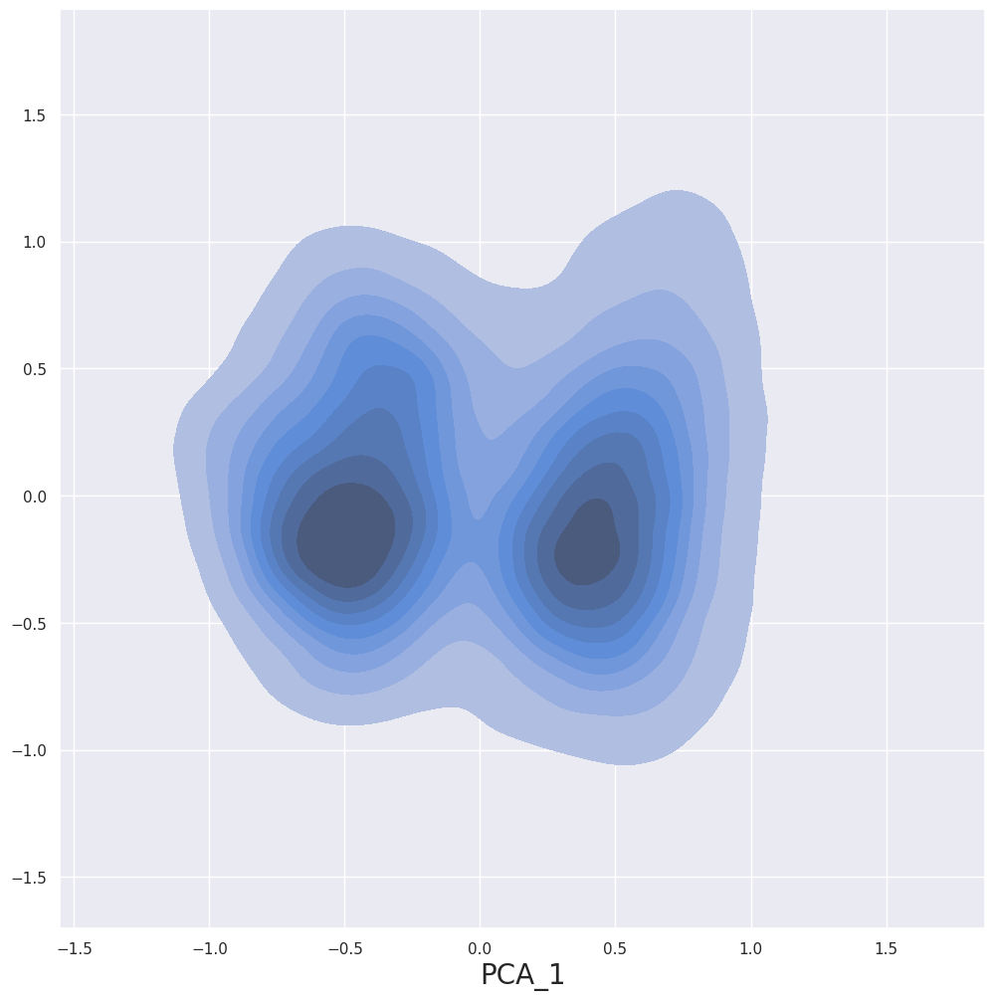

In [ ]:
plt.figure(figsize=(12, 12))
sns.kdeplot(data=df, x=df.iloc[:,0].values, y=df.iloc[:,1].values, fill=True)
plt.xlabel(f'{red}_1', fontsize=20)

output_file = f'{model_name}_{red}_{data}_KDE_{chain}_CDR3'
plt.savefig(f'{output_file}')

In [ ]:
!zip -r /content/pca.zip /content/*PCA*

  adding: content/esm2_RANDOM_H_CDR3_PCA.png (deflated 4%)
  adding: content/esm2_RANDOM_L_CDR3_PCA.png (deflated 4%)
  adding: content/esm2_REAL_H_CDR3_PCA.png (deflated 4%)
  adding: content/esm2_REAL_L_CDR3_PCA.png (deflated 3%)
  adding: content/prott5_RANDOM_H_CDR3_PCA.png (deflated 4%)
  adding: content/prott5_RANDOM_L_CDR3_PCA.png (deflated 4%)
  adding: content/prott5_REAL_H_CDR3_PCA.png (deflated 4%)
  adding: content/prott5_REAL_L_CDR3_PCA.png (deflated 3%)
